In [1]:
import os
import pandas as pd
import matplotlib.pyplot as plt

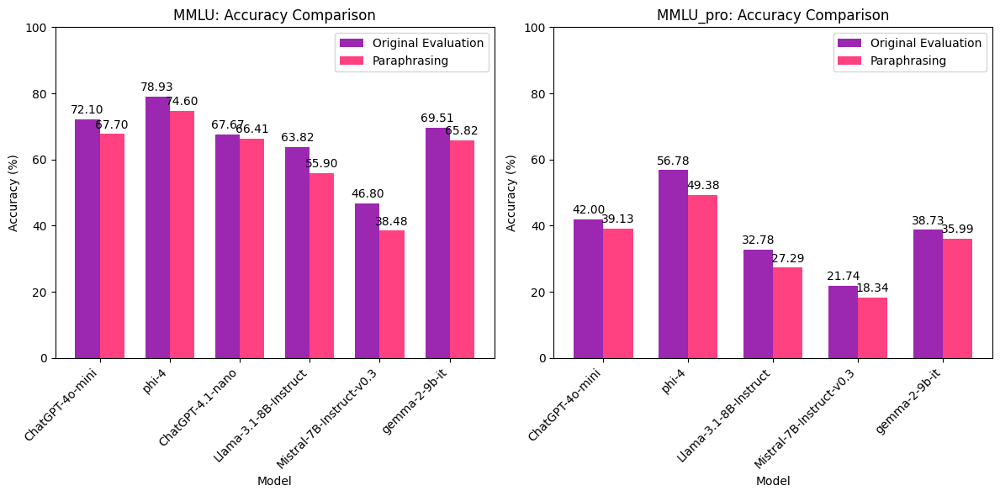

Comparison for MMLU:
                      Model  Accuracy (%)_original  Accuracy (%)_paraphrasing  \
0           ChatGPT-4o-mini              72.097992                  67.696909   
1                     phi-4              78.934625                  74.597636   
2          ChatGPT-4.1-nano              67.667618                  66.405136   
3     Llama-3.1-8B-Instruct              63.815696                  55.903717   
4  Mistral-7B-Instruct-v0.3              46.802450                  38.477425   
5             gemma-2-9b-it              69.505768                  65.823957   

   Difference  
0    4.401082  
1    4.336989  
2    1.262482  
3    7.911978  
4    8.325025  
5    3.681812  

Comparison for MMLU_pro:
                      Model  Accuracy (%)_original  Accuracy (%)_paraphrasing  \
0           ChatGPT-4o-mini              42.000000                  39.132231   
1                     phi-4              56.775740                  49.380268   
2     Llama-3.1-8B-Instruct   

In [4]:
import os
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from matplotlib.colors import LinearSegmentedColormap


# Función para extraer el nombre del modelo del nombre del archivo
def extract_model_name(filename):
    parts = filename.split('_')
    for part in parts:
        if part.startswith('Llama') or part.startswith('Yi') or part.startswith('gemma') or part.startswith('Mistral') or part.startswith('ChatGPT') or part.startswith('phi'):
            return part
    return 'Unknown'

# Función para leer los archivos Excel y extraer las estadísticas de evaluación
def read_eval_stats(folder):
    eval_stats = []
    for filename in os.listdir(folder):
        # Ignorar los archivos que terminan en '_copia.xlsx'
        if filename.endswith('.xlsx') and not filename.endswith('_copia.xlsx'):
            filepath = os.path.join(folder, filename)
            model_name = extract_model_name(filename)
            df = pd.read_excel(filepath, sheet_name='eval_stats')
            df['Model'] = model_name
            eval_stats.append(df)
    return pd.concat(eval_stats, ignore_index=True)

# Leer los archivos Excel de las carpetas MMLU y MMLU_pro
mmlu_eval_stats = read_eval_stats('MMLU')
mmlu_pro_eval_stats = read_eval_stats('MMLU_pro')

# Filtrar los datos para las iteraciones en_l0_eval y en_l1_eval
mmlu_en_l0_eval = mmlu_eval_stats[mmlu_eval_stats['Experiment'] == 'en_l0_eval']
mmlu_en_l1_eval = mmlu_eval_stats[mmlu_eval_stats['Experiment'] == 'en_l1_eval']
mmlu_pro_en_l0_eval = mmlu_pro_eval_stats[mmlu_pro_eval_stats['Experiment'] == 'en_l0_eval']
mmlu_pro_en_l1_eval = mmlu_pro_eval_stats[mmlu_pro_eval_stats['Experiment'] == 'en_l1_eval']

# Crear colormap metálico
colors = ["#9C27B0", "#FF4081"]  # Morado metálico para Original Evaluation, Rosa metálico para Paraphrasing

# Crear gráficos para comparar la precisión de las iteraciones 1 y 2 para MMLU
plt.figure(figsize=(12, 6))

# Gráfico de barras para en_l0_eval y en_l1_eval en MMLU
plt.subplot(1, 2, 1)
models = mmlu_en_l0_eval['Model'].unique()
accuracy_en_l0 = mmlu_en_l0_eval.groupby('Model')['Accuracy (%)'].mean()
accuracy_en_l1 = mmlu_en_l1_eval.groupby('Model')['Accuracy (%)'].mean()

bar_width = 0.35
index = np.arange(len(models))

# Aplicar colores a las barras
bars1 = plt.bar(index, [accuracy_en_l0.get(model, 0) for model in models], bar_width, label='Original Evaluation', color=colors[0])
bars2 = plt.bar(index + bar_width, [accuracy_en_l1.get(model, 0) for model in models], bar_width, label='Paraphrasing', color=colors[1])

# Añadir etiquetas encima de las barras
for bar in bars1:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width() / 2, yval + 1, f'{yval:.2f}', ha='center', va='bottom')
for bar in bars2:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width() / 2, yval + 1, f'{yval:.2f}', ha='center', va='bottom')

plt.xlabel('Model')
plt.ylabel('Accuracy (%)')
plt.title('MMLU: Accuracy Comparison')
plt.xticks(index + bar_width / 2, models, rotation=45, ha='right')
plt.ylim(0, 100)
plt.legend()

# Crear gráficos para comparar la precisión de las iteraciones 1 y 2 para MMLU_pro
plt.subplot(1, 2, 2)
models_pro = mmlu_pro_en_l0_eval['Model'].unique()
accuracy_en_l0_pro = mmlu_pro_en_l0_eval.groupby('Model')['Accuracy (%)'].mean()
accuracy_en_l1_pro = mmlu_pro_en_l1_eval.groupby('Model')['Accuracy (%)'].mean()

index_pro = np.arange(len(models_pro))

# Aplicar colores a las barras
bars1_pro = plt.bar(index_pro, [accuracy_en_l0_pro.get(model, 0) for model in models_pro], bar_width, label='Original Evaluation', color=colors[0])
bars2_pro = plt.bar(index_pro + bar_width, [accuracy_en_l1_pro.get(model, 0) for model in models_pro], bar_width, label='Paraphrasing', color=colors[1])

# Añadir etiquetas encima de las barras
for bar in bars1_pro:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width() / 2, yval + 1, f'{yval:.2f}', ha='center', va='bottom')
for bar in bars2_pro:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width() / 2, yval + 1, f'{yval:.2f}', ha='center', va='bottom')

plt.xlabel('Model')
plt.ylabel('Accuracy (%)')
plt.title('MMLU_pro: Accuracy Comparison')
plt.xticks(index_pro + bar_width / 2, models_pro, rotation=45, ha='right')
plt.ylim(0, 100)
plt.legend()

plt.tight_layout()
plt.show()

# Comparar la precisión de las iteraciones 1 y 2 para MMLU
comparison_mmlu = pd.merge(mmlu_en_l0_eval[['Model', 'Accuracy (%)']], mmlu_en_l1_eval[['Model', 'Accuracy (%)']], on='Model', suffixes=('_original', '_paraphrasing'))
comparison_mmlu['Difference'] = comparison_mmlu['Accuracy (%)_original'] - comparison_mmlu['Accuracy (%)_paraphrasing']

# Comparar la precisión de las iteraciones 1 y 2 para MMLU_pro
comparison_mmlu_pro = pd.merge(mmlu_pro_en_l0_eval[['Model', 'Accuracy (%)']], mmlu_pro_en_l1_eval[['Model', 'Accuracy (%)']], on='Model', suffixes=('_original', '_paraphrasing'))
comparison_mmlu_pro['Difference'] = comparison_mmlu_pro['Accuracy (%)_original'] - comparison_mmlu_pro['Accuracy (%)_paraphrasing']

# Mostrar las tablas de comparación
print("Comparison for MMLU:")
print(comparison_mmlu)
print("\nComparison for MMLU_pro:")
print(comparison_mmlu_pro)

latex_table = comparison_mmlu_pro.to_latex(index=False)
print(latex_table)

# MIRAR SI LAS PREGUNTAS QUE FALLAN LOS MODELOS SON LAS MISMAS Y SE REPITEN O SI CAMBIAN DE UNO A OTRO


In [5]:
# SACAR EXCEL DE ACCURACY RELATIVA
import os
import pandas as pd

# Función para extraer el nombre del modelo del nombre del archivo
def extract_model_name(filename):
    parts = filename.split('_')
    for part in parts:
        if part.startswith('Llama') or part.startswith('Yi') or part.startswith('gemma') or part.startswith('Mistral') or part.startswith('ChatGPT') or part.startswith('phi'):
            return part
    return 'Unknown'

def calculate_relative_accuracy(df, penalty):
    total_questions = len(df)
    df['Score'] = df.apply(lambda row: 1 if row['correct_answer'] == row['llm_answer_filtered'] else -penalty, axis=1)
    total_score = df['Score'].sum()
    normalized_score = total_score / total_questions
    return total_score, normalized_score

def process_accuracy(folder, output_path):
    models = []
    scores_en_l0 = []
    normalized_scores_en_l0 = []
    scores_en_l1 = []
    normalized_scores_en_l1 = []
    
    for filename in os.listdir(folder):
        if filename.startswith('paraphrases_') and filename.endswith('.xlsx'):
            filepath = os.path.join(folder, filename)
            model_name = extract_model_name(filename)
            models.append(model_name)
            
            df_en_l0 = pd.read_excel(filepath, sheet_name='en_l0', engine='openpyxl')
            df_en_l1 = pd.read_excel(filepath, sheet_name='en_l1', engine='openpyxl')
            
            if 'MMLU' in folder:
                penalty = 1/3
            else:
                penalty = 1/9
            
            score_en_l0, normalized_score_en_l0 = calculate_relative_accuracy(df_en_l0, penalty)
            score_en_l1, normalized_score_en_l1 = calculate_relative_accuracy(df_en_l1, penalty)
            
            scores_en_l0.append(score_en_l0)
            normalized_scores_en_l0.append(normalized_score_en_l0)
            scores_en_l1.append(score_en_l1)
            normalized_scores_en_l1.append(normalized_score_en_l1)
    
    result_df = pd.DataFrame({
        'Model': models,
        'Score_en_l0': scores_en_l0,
        'Normalized_Score_en_l0': normalized_scores_en_l0,
        'Score_en_l1': scores_en_l1,
        'Normalized_Score_en_l1': normalized_scores_en_l1
    })
    
    return result_df

# Procesar los archivos de MMLU y MMLU_pro
folder_mmlu = 'MMLU'
folder_mmlu_pro = 'MMLU_pro'
output_path = 'RELATIVE_ACCURACY.xlsx'

result_mmlu = process_accuracy(folder_mmlu, output_path)
result_mmlu_pro = process_accuracy(folder_mmlu_pro, output_path)

# Guardar los resultados en un archivo Excel
with pd.ExcelWriter(output_path, engine='openpyxl') as writer:
    result_mmlu.to_excel(writer, sheet_name='MMLU', index=False)
    result_mmlu_pro.to_excel(writer, sheet_name='MMLU_pro', index=False)

print("Archivo RELATIVE_ACCURACY.xlsx generado con éxito.")

Archivo RELATIVE_ACCURACY.xlsx generado con éxito.


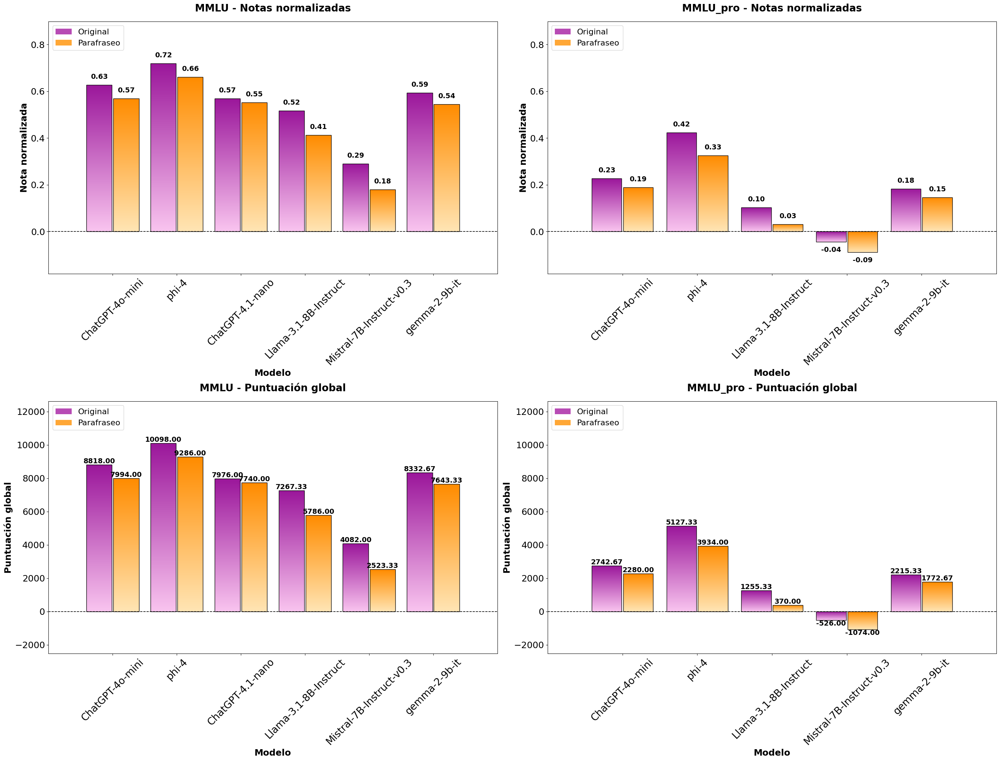

In [5]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from matplotlib.colors import LinearSegmentedColormap
from matplotlib.patches import Rectangle

# Leer el archivo
input_path = 'RELATIVE_ACCURACY.xlsx'
df_mmlu = pd.read_excel(input_path, sheet_name='MMLU', engine='openpyxl')
df_mmlu_pro = pd.read_excel(input_path, sheet_name='MMLU_pro', engine='openpyxl')

# Colormaps degradados
naranja_cmap = LinearSegmentedColormap.from_list("naranja", ["#ffe5b4", "#ff8c00"])
magenta_cmap = LinearSegmentedColormap.from_list("magenta", ["#f9c4ef", "#9b179b"])

def create_vertical_gradient_bar(ax, x, height, width, cmap, zorder=1):
    grad = np.linspace(0, 1, 256).reshape(-1, 1)
    bottom = min(0, height)
    top = max(0, height)
    im = ax.imshow(
        grad,
        extent=(x, x + width, bottom, top),
        origin='lower',
        aspect='auto',
        cmap=cmap,
        zorder=zorder,
        clip_on=True
    )
    rect = Rectangle((x, bottom), width, top - bottom, transform=ax.transData, linewidth=0, edgecolor=None)
    im.set_clip_path(rect)
    ax.add_patch(Rectangle((x, bottom), width, top - bottom, edgecolor='black', facecolor='none', lw=1, zorder=zorder + 1))

def create_barplot(df, title, ax, metric, ylabel, cmap1, cmap2):
    bar_width = 0.8
    spacing = 2.0
    index = np.arange(len(df['Model'])) * spacing

    heights1 = df[f'{metric}_en_l0']
    heights2 = df[f'{metric}_en_l1']

    xticks = []
    xticklabels = []

    for i in range(len(index)):
        x_center = index[i]
        x1 = x_center - bar_width - 0.02
        x2 = x_center + 0.02

        create_vertical_gradient_bar(ax, x1, heights1[i], bar_width, cmap1)
        create_vertical_gradient_bar(ax, x2, heights2[i], bar_width, cmap2)

        for x_pos, h in zip([x1, x2], [heights1[i], heights2[i]]):
            y_offset = 0.02 * (1 if h >= 0 else -1)
            ax.text(x_pos + bar_width / 2, h + y_offset, f'{h:.2f}',
                    ha='center', va='bottom' if h >= 0 else 'top',
                    fontsize=14, fontweight='bold')

        xticks.append(x_center)
        xticklabels.append(df['Model'][i])

    ax.set_xlabel('Modelo', fontsize=18, fontweight='bold')
    ax.set_ylabel(ylabel, fontsize=18, fontweight='bold')
    ax.set_title(title, fontsize=20, fontweight='bold', pad=20)
    ax.set_xticks(xticks)
    ax.set_xticklabels(xticklabels, rotation=45, ha='center', fontsize=20)
    ax.tick_params(axis='y', labelsize=18)

    ax.set_xlim(index[0] - spacing, index[-1] + spacing)

    ax.bar(0, 0, color=cmap1(0.7), label='Original')
    ax.bar(0, 0, color=cmap2(0.7), label='Parafraseo')
    ax.legend(fontsize=16, loc='upper left')

# Crear figura más alargada
fig, axes = plt.subplots(2, 2, figsize=(28, 22))

# Crear gráficos
create_barplot(df_mmlu, 'MMLU - Notas normalizadas', axes[0, 0], 'Normalized_Score', 'Nota normalizada', magenta_cmap, naranja_cmap)
create_barplot(df_mmlu, 'MMLU - Puntuación global', axes[1, 0], 'Score', 'Puntuación global', magenta_cmap, naranja_cmap)
create_barplot(df_mmlu_pro, 'MMLU_pro - Notas normalizadas', axes[0, 1], 'Normalized_Score', 'Nota normalizada', magenta_cmap, naranja_cmap)
create_barplot(df_mmlu_pro, 'MMLU_pro - Puntuación global', axes[1, 1], 'Score', 'Puntuación global', magenta_cmap, naranja_cmap)

# Ajuste de límites Y para incluir espacio por debajo del 0 (1/4 del rango positivo)
for ax, metric in zip([axes[0, 0], axes[1, 0], axes[0, 1], axes[1, 1]],
                      ['Normalized_Score', 'Score', 'Normalized_Score', 'Score']):
    df = df_mmlu if 'MMLU' in ax.get_title() else df_mmlu_pro
    heights_l0 = df[f'{metric}_en_l0']
    heights_l1 = df[f'{metric}_en_l1']

    y_max = max(heights_l0.max(), heights_l1.max())
    y_min = min(heights_l0.min(), heights_l1.min())
    
    # Calcular rango positivo y definir margen negativo
    positive_range = y_max if y_min >= 0 else y_max - y_min
    lower_margin = positive_range * 0.25

    ax.set_ylim(-lower_margin, y_max + lower_margin)

    # Línea discontinua en y=0 (dentro del rectángulo)
    ax.axhline(0, color='black', linestyle='--', linewidth=1.2, zorder=2)

plt.tight_layout(rect=[0, 0, 1, 0.97])
plt.show()


In [7]:
#PARA CREAR UNA COPIA DE LOS EXCEL CON SUS CATEGORÍAS
import os
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from matplotlib.colors import LinearSegmentedColormap
from openpyxl import load_workbook


def extract_model_name(filename):
    parts = filename.split('_')
    for part in parts:
        if part.startswith(('Llama', 'Mistral', 'Yi', 'gemma', 'ChatGPT', 'phi')):
            return part
    return 'Unknown'

# Función para leer los archivos Excel y extraer las estadísticas de evaluación
def read_eval_stats(folder):
    eval_stats = []
    for filename in os.listdir(folder):
        if filename.endswith('.xlsx'):
            filepath = os.path.join(folder, filename)
            model_name = extract_model_name(filename)
            df = pd.read_excel(filepath, sheet_name='eval_stats')
            df['Model'] = model_name
            eval_stats.append(df)
    return pd.concat(eval_stats, ignore_index=True)

    
# Función para añadir la columna CATEGORY a cada archivo Excel de cada modelo en las hojas en_l0 y en_l1
def add_category_to_excel(folder, mmlu_completo_path):
    # Leer el archivo MMLU_completo.xlsx para obtener las categorías desde la hoja 'en'
    mmlu_completo = pd.read_excel(mmlu_completo_path, sheet_name='en', engine='openpyxl')
    
    for filename in os.listdir(folder):
        if filename.endswith('.xlsx'):
            filepath = os.path.join(folder, filename)
            model_name = extract_model_name(filename)
            
            try:
                # Leer las hojas en_l0 y en_l1 del archivo Excel del modelo
                df_en_l0 = pd.read_excel(filepath, sheet_name='en_l0', engine='openpyxl')
                df_en_l1 = pd.read_excel(filepath, sheet_name='en_l1', engine='openpyxl')
                
                # Añadir la columna CATEGORY con el ID de la categoría
                df_en_l0['CATEGORY'] = mmlu_completo['id']
                df_en_l1['CATEGORY'] = mmlu_completo['id']
                
                # Calcular la tasa de aciertos por categoría
                def calculate_accuracy(df):
                    df['correct'] = df['correct_answer'] == df['llm_answer_filtered']
                    accuracy_by_category = df.groupby('CATEGORY')['correct'].mean().reset_index()
                    accuracy_by_category.columns = ['CATEGORY', 'ACCURACY']
                    return accuracy_by_category
                
                accuracy_en_l0 = calculate_accuracy(df_en_l0)
                accuracy_en_l1 = calculate_accuracy(df_en_l1)
                
                # Crear una hoja de categorías con la tasa de aciertos
                categories_df = pd.merge(accuracy_en_l0, accuracy_en_l1, on='CATEGORY', suffixes=('_en_l0', '_en_l1'))
                
                # Crear una copia del DataFrame y guardarlo en un nuevo archivo Excel
                new_filepath = os.path.join(folder, f"{model_name}_copia.xlsx")
                with pd.ExcelWriter(new_filepath, engine='openpyxl') as writer:
                    df_en_l0.to_excel(writer, sheet_name='en_l0', index=False)
                    df_en_l1.to_excel(writer, sheet_name='en_l1', index=False)
                    categories_df.to_excel(writer, sheet_name='CATEGORIES', index=False)
            except Exception as e:
                print(f"Error processing file {filepath}: {e}")


# Ejemplo de uso
folder_mmlu = 'MMLU'
folder_mmlu_pro = 'MMLU_pro'
mmlu_completo_path = '../Datasets/MMLU_completo.xlsx'
mmlu_pro_completo_path = '../Datasets/MMLU_pro_completo.xlsx'

# Añadir la columna CATEGORY a los archivos Excel de MMLU
add_category_to_excel(folder_mmlu, mmlu_completo_path)

# Añadir la columna CATEGORY a los archivos Excel de MMLU_pro
add_category_to_excel(folder_mmlu_pro, mmlu_pro_completo_path)

In [8]:
#PARA SACAR EXCEL DE CATEGORÍAS CON SU TASA DE ACIERTOS
import os
import pandas as pd

def extract_model_name(filename):
    parts = filename.split('_')
    for part in parts:
        if part.startswith(('Llama', 'Mistral', 'Yi', 'gemma', 'ChatGPT', 'phi')):
            return part
    return 'Unknown'

def aggregate_categories_accuracy(folder_mmlu, folder_mmlu_pro, output_path):
    # Crear DataFrames vacíos para MMLU y MMLU_pro
    df_mmlu = pd.DataFrame()
    df_mmlu_pro = pd.DataFrame()
    
    # Función para procesar cada archivo y agregar los datos al DataFrame correspondiente
    def process_files(folder, df):
        for filename in os.listdir(folder):
            if filename.endswith('_copia.xlsx'):
                filepath = os.path.join(folder, filename)
                model_name = extract_model_name(filename)
                
                try:
                    # Leer la hoja CATEGORIES del archivo Excel del modelo
                    categories_df = pd.read_excel(filepath, sheet_name='CATEGORIES', engine='openpyxl')
                    
                    # Renombrar las columnas para incluir el nombre del modelo
                    categories_df = categories_df.rename(columns={
                        'ACCURACY_en_l0': f'{model_name}_en_l0',
                        'ACCURACY_en_l1': f'{model_name}_en_l1'
                    })
                    
                    # Agregar los datos al DataFrame correspondiente
                    if df.empty:
                        df = categories_df
                    else:
                        df = pd.merge(df, categories_df, on='CATEGORY', how='outer')
                except Exception as e:
                    print(f"Error processing file {filepath}: {e}")
        return df
    
    # Procesar los archivos de MMLU y MMLU_pro
    df_mmlu = process_files(folder_mmlu, df_mmlu)
    df_mmlu_pro = process_files(folder_mmlu_pro, df_mmlu_pro)
    
    # Guardar los DataFrames en un nuevo archivo Excel
    with pd.ExcelWriter(output_path, engine='openpyxl') as writer:
        df_mmlu.to_excel(writer, sheet_name='MMLU', index=False)
        df_mmlu_pro.to_excel(writer, sheet_name='MMLU_pro', index=False)

# Ejemplo de uso
folder_mmlu = 'MMLU'
folder_mmlu_pro = 'MMLU_pro'
output_path = 'CATEGORIES_ACCURACY.xlsx'

# Agregar las tasas de aciertos de las categorías a un archivo Excel
aggregate_categories_accuracy(folder_mmlu, folder_mmlu_pro, output_path)

In [9]:
import os
import pandas as pd

# Función para extraer el nombre del modelo del nombre del archivo
def extract_model_name(filename):
    parts = filename.split('_')
    for part in parts:
        if part.startswith(('Llama', 'Mistral', 'Yi', 'gemma', 'ChatGPT', 'phi')):
            return part
    return 'Unknown'

# Función para calcular la accuracy relativa por categoría
def calculate_relative_accuracy_by_category(df, penalty):
    df['Score'] = df.apply(lambda row: 1 if row['correct_answer'] == row['llm_answer_filtered'] else -penalty, axis=1)
    category_scores = df.groupby('CATEGORY')['Score'].sum().reset_index()
    category_scores.rename(columns={'Score': 'Relative_Accuracy'}, inplace=True)
    category_counts = df.groupby('CATEGORY').size().reset_index(name='Num_Questions')
    return category_scores, category_counts

# Función para procesar los archivos y agregar las columnas de accuracy relativa
def aggregate_categories_accuracy(folder_mmlu, folder_mmlu_pro, output_path):
    # Crear DataFrames vacíos para MMLU y MMLU_pro
    df_mmlu = pd.DataFrame()
    df_mmlu_pro = pd.DataFrame()
    
    # Función para procesar cada archivo y agregar los datos al DataFrame correspondiente
    def process_files(folder, df, penalty):
        for filename in os.listdir(folder):
            if filename.endswith('_copia.xlsx'):
                filepath = os.path.join(folder, filename)
                model_name = extract_model_name(filename)
                
                try:
                    # Leer la hoja CATEGORIES del archivo Excel del modelo
                    categories_df = pd.read_excel(filepath, sheet_name='CATEGORIES', engine='openpyxl')
                    
                    # Leer las preguntas para calcular la accuracy relativa
                    df_questions_en_l0 = pd.read_excel(filepath, sheet_name='en_l0', engine='openpyxl')
                    df_questions_en_l1 = pd.read_excel(filepath, sheet_name='en_l1', engine='openpyxl')
                    
                    # Calcular la accuracy relativa para en_l0 y en_l1
                    scores_l0, counts = calculate_relative_accuracy_by_category(df_questions_en_l0, penalty)
                    scores_l1, _ = calculate_relative_accuracy_by_category(df_questions_en_l1, penalty)
                    
                    # Renombrar las columnas para incluir el nombre del modelo
                    categories_df = categories_df.rename(columns={
                        'ACCURACY_en_l0': f'{model_name}_en_l0',
                        'ACCURACY_en_l1': f'{model_name}_en_l1'
                    })
                    
                    # Agregar las columnas de accuracy relativa
                    categories_df = categories_df.merge(scores_l0, on='CATEGORY', how='left')
                    categories_df.rename(columns={'Relative_Accuracy': f'{model_name}_accuracy_relative_en_l0'}, inplace=True)
                    categories_df = categories_df.merge(scores_l1, on='CATEGORY', how='left')
                    categories_df.rename(columns={'Relative_Accuracy': f'{model_name}_accuracy_relative_en_l1'}, inplace=True)
                    categories_df = categories_df.merge(counts, on='CATEGORY', how='left', suffixes=('', '_new'))
                    
                    # Renombrar la columna de número de preguntas para evitar conflictos
                    if 'Num_Questions_new' in categories_df.columns:
                        categories_df.rename(columns={'Num_Questions_new': 'Num_Questions'}, inplace=True)
                    
                    # Agregar los datos al DataFrame correspondiente
                    if df.empty:
                        df = categories_df
                    else:
                        df = pd.merge(df, categories_df, on='CATEGORY', how='outer', suffixes=('', '_duplicate'))
                        # Eliminar columnas duplicadas si existen
                        df = df.loc[:, ~df.columns.str.endswith('_duplicate')]
                except Exception as e:
                    print(f"Error processing file {filepath}: {e}")
        return df
    
    # Procesar los archivos de MMLU y MMLU_pro
    df_mmlu = process_files(folder_mmlu, df_mmlu, penalty=1/3)
    df_mmlu_pro = process_files(folder_mmlu_pro, df_mmlu_pro, penalty=1/9)
    
    # Guardar los DataFrames en un nuevo archivo Excel
    with pd.ExcelWriter(output_path, engine='openpyxl') as writer:
        df_mmlu.to_excel(writer, sheet_name='MMLU', index=False)
        df_mmlu_pro.to_excel(writer, sheet_name='MMLU_pro', index=False)
    
    return df_mmlu, df_mmlu_pro

import os
import pandas as pd

# Función para calcular la relación entre accuracy_relative_en_l1 y accuracy_relative_en_l0
def calculate_model_relations(df, sheet_name, writer):
    relation_df = pd.DataFrame()
    relation_df['CATEGORY'] = df['CATEGORY']  # Mantener la columna de categorías
    
    # Iterar sobre las columnas para calcular la relación
    for col in df.columns:
        if col.endswith('_accuracy_relative_en_l1'):
            model_name = col.replace('_accuracy_relative_en_l1', '')
            col_l0 = f'{model_name}_accuracy_relative_en_l0'
            if col_l0 in df.columns:
                relation_df[f'{model_name}_relation'] = df[col] / df[col_l0]
    
    # Guardar el resultado en la hoja correspondiente
    relation_df.to_excel(writer, sheet_name=sheet_name, index=False)

# Ejemplo de uso
folder_mmlu = 'MMLU'
folder_mmlu_pro = 'MMLU_pro'
output_path = 'CATEGORIES_ACCURACY_UPDATED.xlsx'
relation_output_path = 'RELACION_MODELOS.xlsx'

# Agregar las tasas de aciertos de las categorías a un archivo Excel
df_mmlu, df_mmlu_pro = aggregate_categories_accuracy(folder_mmlu, folder_mmlu_pro, output_path)

# Calcular las relaciones y guardarlas en un archivo aparte
with pd.ExcelWriter(relation_output_path, engine='openpyxl') as writer:
    calculate_model_relations(df_mmlu, 'MMLU', writer)
    calculate_model_relations(df_mmlu_pro, 'MMLU_pro', writer)

print("Archivos generados con éxito: CATEGORIES_ACCURACY_UPDATED.xlsx y RELACION_MODELOS.xlsx")

Archivos generados con éxito: CATEGORIES_ACCURACY_UPDATED.xlsx y RELACION_MODELOS.xlsx


In [10]:
#OBTENER EXCELS CON NOTAS DE CATEGORÍA NORMALIZADA
import os
import pandas as pd

# Función para extraer el nombre del modelo del nombre del archivo
def extract_model_name(filename):
    parts = filename.split('_')
    for part in parts:
        if part.startswith(('Llama', 'Mistral', 'Yi', 'gemma', 'ChatGPT', 'phi')):
            return part
    return 'Unknown'

# Función para calcular la accuracy relativa por categoría
def calculate_relative_accuracy_by_category(df, penalty):
    df['Score'] = df.apply(lambda row: 1 if row['correct_answer'] == row['llm_answer_filtered'] else -penalty, axis=1)
    category_scores = df.groupby('CATEGORY')['Score'].sum().reset_index()
    category_scores.rename(columns={'Score': 'Relative_Accuracy'}, inplace=True)
    category_counts = df.groupby('CATEGORY').size().reset_index(name='Num_Questions')
    return category_scores, category_counts

# Función para procesar los archivos y agregar las columnas de accuracy relativa
def aggregate_categories_accuracy(folder_mmlu, folder_mmlu_pro, output_path):
    # Crear DataFrames vacíos para MMLU y MMLU_pro
    df_mmlu = pd.DataFrame()
    df_mmlu_pro = pd.DataFrame()
    
    # Función para procesar cada archivo y agregar los datos al DataFrame correspondiente
    def process_files(folder, df, penalty):
        for filename in os.listdir(folder):
            if filename.endswith('_copia.xlsx'):
                filepath = os.path.join(folder, filename)
                model_name = extract_model_name(filename)
                
                try:
                    # Leer la hoja CATEGORIES del archivo Excel del modelo
                    categories_df = pd.read_excel(filepath, sheet_name='CATEGORIES', engine='openpyxl')
                    
                    # Leer las preguntas para calcular la accuracy relativa
                    df_questions_en_l0 = pd.read_excel(filepath, sheet_name='en_l0', engine='openpyxl')
                    df_questions_en_l1 = pd.read_excel(filepath, sheet_name='en_l1', engine='openpyxl')
                    
                    # Calcular la accuracy relativa para en_l0 y en_l1
                    scores_l0, counts = calculate_relative_accuracy_by_category(df_questions_en_l0, penalty)
                    scores_l1, _ = calculate_relative_accuracy_by_category(df_questions_en_l1, penalty)
                    
                    # Renombrar las columnas para incluir el nombre del modelo
                    categories_df = categories_df.rename(columns={
                        'ACCURACY_en_l0': f'{model_name}_en_l0',
                        'ACCURACY_en_l1': f'{model_name}_en_l1'
                    })
                    
                    # Agregar las columnas de accuracy relativa
                    categories_df = categories_df.merge(scores_l0, on='CATEGORY', how='left')
                    categories_df.rename(columns={'Relative_Accuracy': f'{model_name}_accuracy_relative_en_l0'}, inplace=True)
                    categories_df = categories_df.merge(scores_l1, on='CATEGORY', how='left')
                    categories_df.rename(columns={'Relative_Accuracy': f'{model_name}_accuracy_relative_en_l1'}, inplace=True)
                    categories_df = categories_df.merge(counts, on='CATEGORY', how='left', suffixes=('', '_new'))
                    
                    # Renombrar la columna de número de preguntas para evitar conflictos
                    if 'Num_Questions_new' in categories_df.columns:
                        categories_df.rename(columns={'Num_Questions_new': 'Num_Questions'}, inplace=True)
                    
                    # Agregar los datos al DataFrame correspondiente
                    if df.empty:
                        df = categories_df
                    else:
                        df = pd.merge(df, categories_df, on='CATEGORY', how='outer', suffixes=('', '_duplicate'))
                        # Eliminar columnas duplicadas si existen
                        df = df.loc[:, ~df.columns.str.endswith('_duplicate')]
                except Exception as e:
                    print(f"Error processing file {filepath}: {e}")
        return df
    
    # Procesar los archivos de MMLU y MMLU_pro
    df_mmlu = process_files(folder_mmlu, df_mmlu, penalty=1/3)
    df_mmlu_pro = process_files(folder_mmlu_pro, df_mmlu_pro, penalty=1/9)
    
    # Añadir columnas normalizadas
    def add_normalized_columns(df):
        for col in df.columns:
            if col.endswith('_accuracy_relative_en_l0'):
                model_name = col.replace('_accuracy_relative_en_l0', '')
                df[f'{model_name}_NORMALIZED_enl0'] = df[col] / df['Num_Questions']
            elif col.endswith('_accuracy_relative_en_l1'):
                model_name = col.replace('_accuracy_relative_en_l1', '')
                df[f'{model_name}_NORMALIZED_enl1'] = df[col] / df['Num_Questions']
        return df
    
    df_mmlu = add_normalized_columns(df_mmlu)
    df_mmlu_pro = add_normalized_columns(df_mmlu_pro)
    
    # Guardar los DataFrames en un nuevo archivo Excel
    with pd.ExcelWriter(output_path, engine='openpyxl') as writer:
        df_mmlu.to_excel(writer, sheet_name='MMLU', index=False)
        df_mmlu_pro.to_excel(writer, sheet_name='MMLU_pro', index=False)
    
    return df_mmlu, df_mmlu_pro

# Función para calcular la relación entre accuracy_relative_en_l1 y accuracy_relative_en_l0
def calculate_model_relations(df, sheet_name, writer):
    relation_df = pd.DataFrame()
    relation_df['CATEGORY'] = df['CATEGORY']  # Mantener la columna de categorías
    
    # Iterar sobre las columnas para calcular la relación
    for col in df.columns:
        if col.endswith('_accuracy_relative_en_l1'):
            model_name = col.replace('_accuracy_relative_en_l1', '')
            col_l0 = f'{model_name}_accuracy_relative_en_l0'
            if col_l0 in df.columns:
                relation_df[f'{model_name}_relation'] = df[col] / df[col_l0]
    
    # Guardar el resultado en la hoja correspondiente
    relation_df.to_excel(writer, sheet_name=sheet_name, index=False)

# Ejemplo de uso
folder_mmlu = 'MMLU'
folder_mmlu_pro = 'MMLU_pro'
output_path = 'CATEGORIES_ACCURACY_UPDATED.xlsx'
relation_output_path = 'RELACION_MODELOS.xlsx'

# Agregar las tasas de aciertos de las categorías a un archivo Excel
df_mmlu, df_mmlu_pro = aggregate_categories_accuracy(folder_mmlu, folder_mmlu_pro, output_path)

# Calcular las relaciones y guardarlas en un archivo aparte
with pd.ExcelWriter(relation_output_path, engine='openpyxl') as writer:
    calculate_model_relations(df_mmlu, 'MMLU', writer)
    calculate_model_relations(df_mmlu_pro, 'MMLU_pro', writer)

print("Archivos generados con éxito: CATEGORIES_ACCURACY_UPDATED.xlsx y RELACION_MODELOS.xlsx")

Archivos generados con éxito: CATEGORIES_ACCURACY_UPDATED.xlsx y RELACION_MODELOS.xlsx


/var/folders/c2/7s13mf2d2v363_1g197xk9bm0000gn/T/ipykernel_1853/2464975216.py:64: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 1, 0.95])  # Ajustar el layout para que no se solapen los títulos


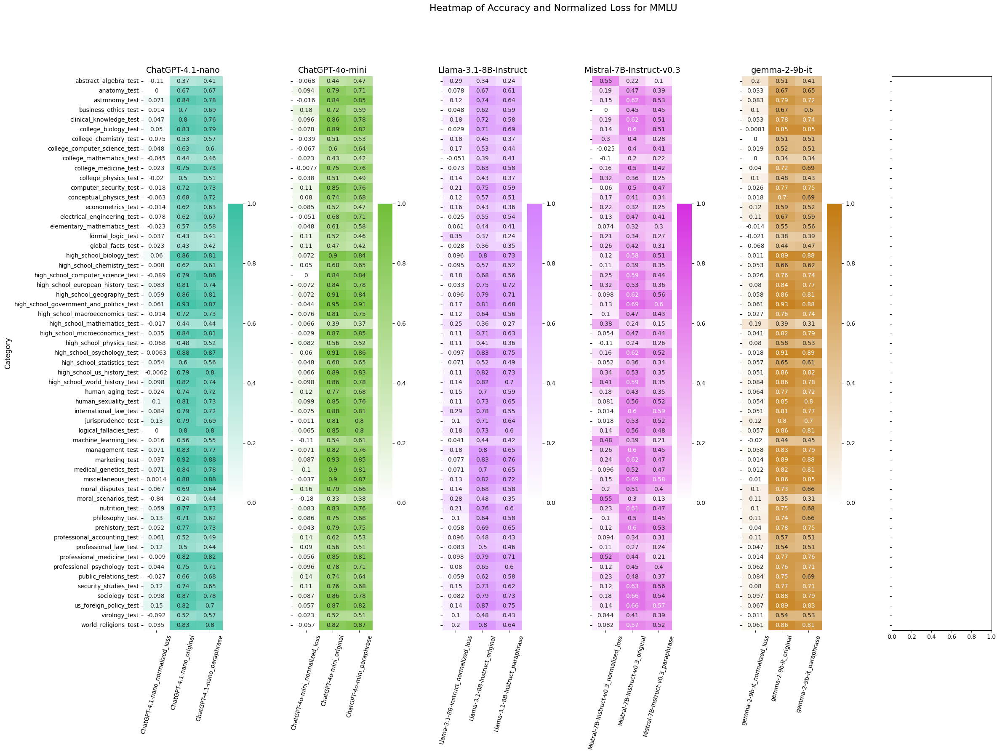

/var/folders/c2/7s13mf2d2v363_1g197xk9bm0000gn/T/ipykernel_1853/2464975216.py:64: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 1, 0.95])  # Ajustar el layout para que no se solapen los títulos


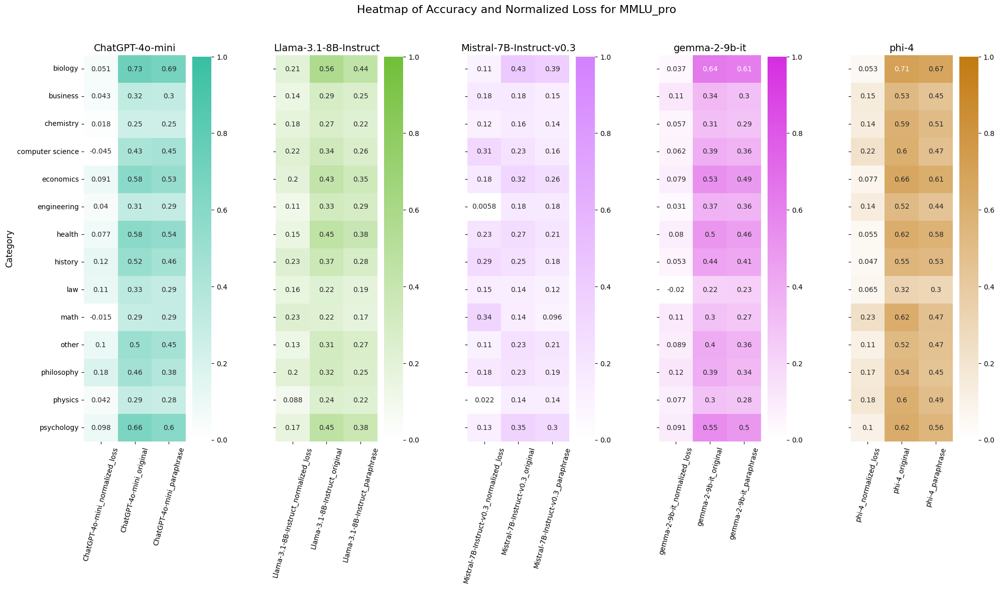

In [11]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
from matplotlib.colors import LinearSegmentedColormap

def plot_heatmaps(input_path):
    # Leer el archivo CATEGORIES_ACCURACY.xlsx
    df_mmlu = pd.read_excel(input_path, sheet_name='MMLU', engine='openpyxl')
    df_mmlu_pro = pd.read_excel(input_path, sheet_name='MMLU_pro', engine='openpyxl')
    
    def create_combined_heatmap(df, title):
        categories = df['CATEGORY']
        models = [col.split('_')[0] for col in df.columns if '_en_l0' in col]
        models = sorted(set(models))  # Eliminar duplicados y ordenar
        
        cmap_turquesa = LinearSegmentedColormap.from_list("turquesa", ["#ffffff", "#38BFA2"])  # Blanco → Turquesa
        cmap_pastel_verde = LinearSegmentedColormap.from_list("verde_pastel", ["#ffffff", "#71BF38"])  # Blanco → Verde Pastel
        cmap_pastel_morado = LinearSegmentedColormap.from_list("morado_pastel", ["#ffffff", "#D481FE"])  # Blanco → Morado Pastel
        cmap_magenta = LinearSegmentedColormap.from_list("magenta", ["#ffffff", "#D52EE0"])  # Blanco → Magenta
        cmap_naranja = LinearSegmentedColormap.from_list("naranja", ["#ffffff", "#C37A11"])  # Blanco → Naranja
        cmap_list = [cmap_turquesa, cmap_pastel_verde, cmap_pastel_morado, cmap_magenta, cmap_naranja]  # Diferentes colores
        
        heatmap_data = []
        for model in models:
            en_l0_col = f'{model}_en_l0'
            en_l1_col = f'{model}_en_l1'
            diff_col = f'{model}_diff'
            norm_loss_col = f'{model}_normalized_loss'
            
            # Calcular la diferencia y la normalized loss
            df[diff_col] = df[en_l0_col] - df[en_l1_col]
            df[norm_loss_col] = df[diff_col] / df[en_l0_col]  # Normalized loss
            
            for category in categories:
                en_l0 = df.loc[df['CATEGORY'] == category, en_l0_col].values[0]
                en_l1 = df.loc[df['CATEGORY'] == category, en_l1_col].values[0]
                diff = df.loc[df['CATEGORY'] == category, diff_col].values[0]
                norm_loss = df.loc[df['CATEGORY'] == category, norm_loss_col].values[0]
                
                heatmap_data.append([category, f'{model}_original', en_l0])
                heatmap_data.append([category, f'{model}_paraphrase', en_l1])
                # heatmap_data.append([category, f'{model}_DIFFERENCE', diff])
                heatmap_data.append([category, f'{model}_normalized_loss', norm_loss])
        
        heatmap_df = pd.DataFrame(heatmap_data, columns=['CATEGORY', 'METRIC', 'VALUE'])
        heatmap_pivot = heatmap_df.pivot(index='CATEGORY', columns='METRIC', values='VALUE')
        
        fig_width = 8 + len(models) * 3  # Ajuste dinámico del ancho
        fig_height = max(10, len(categories) * 0.3)  # Ajuste dinámico de la altura
        fig, axes = plt.subplots(1, len(models), figsize=(fig_width, fig_height), sharey=True, gridspec_kw={'wspace': 0.5})        
        if len(models) == 1:
            axes = [axes]  # Para manejar el caso de un solo modelo
        
        for idx, (model, cmap) in enumerate(zip(models, cmap_list)):
            model_cols = [col for col in heatmap_pivot.columns if model in col]
            sns.heatmap(heatmap_pivot[model_cols], annot=True, cmap=cmap, cbar=True, ax=axes[idx], vmin=0, vmax=1)
            axes[idx].set_title(model, fontsize=14)
            axes[idx].set_xlabel('')
            axes[idx].set_ylabel('' if idx > 0 else 'Category', fontsize=12)
            axes[idx].tick_params(axis='x', rotation=75)
        
        fig.suptitle(title, fontsize=16)
        plt.tight_layout(rect=[0, 0, 1, 0.95])  # Ajustar el layout para que no se solapen los títulos
        plt.show()
    
    # Crear heatmaps para MMLU y MMLU_pro
    create_combined_heatmap(df_mmlu, 'Heatmap of Accuracy and Normalized Loss for MMLU')
    create_combined_heatmap(df_mmlu_pro, 'Heatmap of Accuracy and Normalized Loss for MMLU_pro')

# Ejemplo de uso
input_path = 'CATEGORIES_ACCURACY.xlsx'

# Generar los heatmaps
plot_heatmaps(input_path)

/var/folders/c2/7s13mf2d2v363_1g197xk9bm0000gn/T/ipykernel_1853/1245537249.py:125: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 1, 0.95])


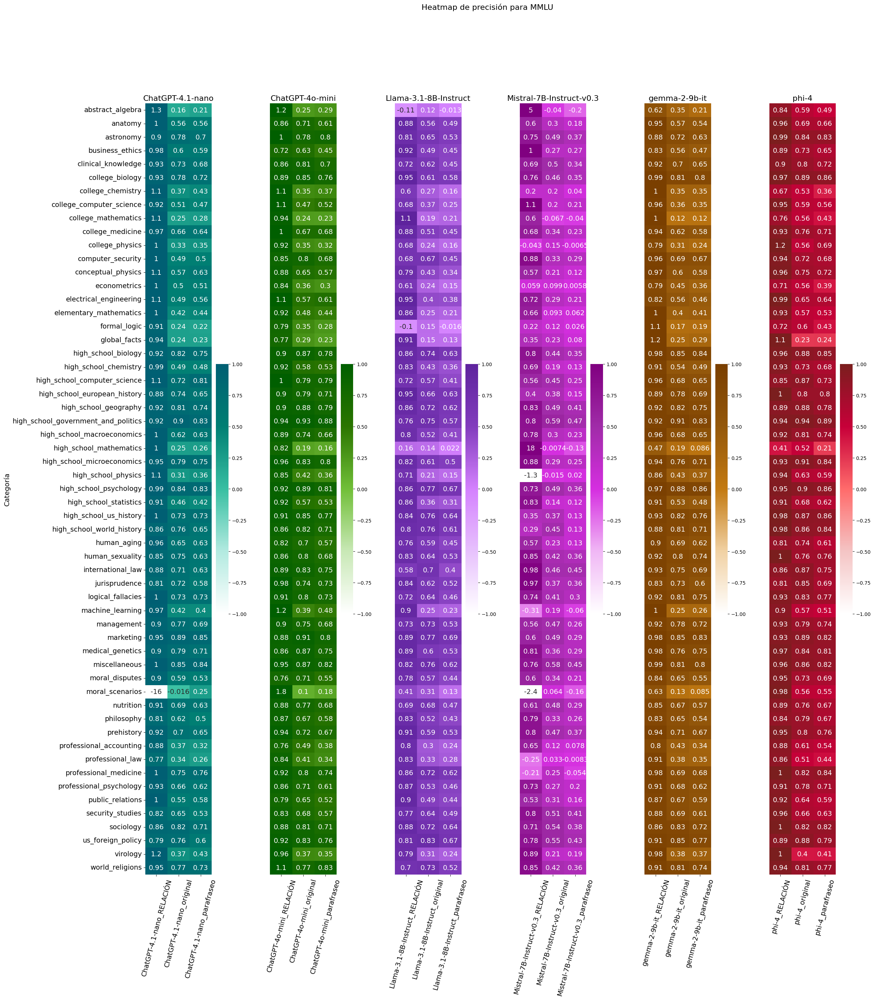

/var/folders/c2/7s13mf2d2v363_1g197xk9bm0000gn/T/ipykernel_1853/1245537249.py:125: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 1, 0.95])


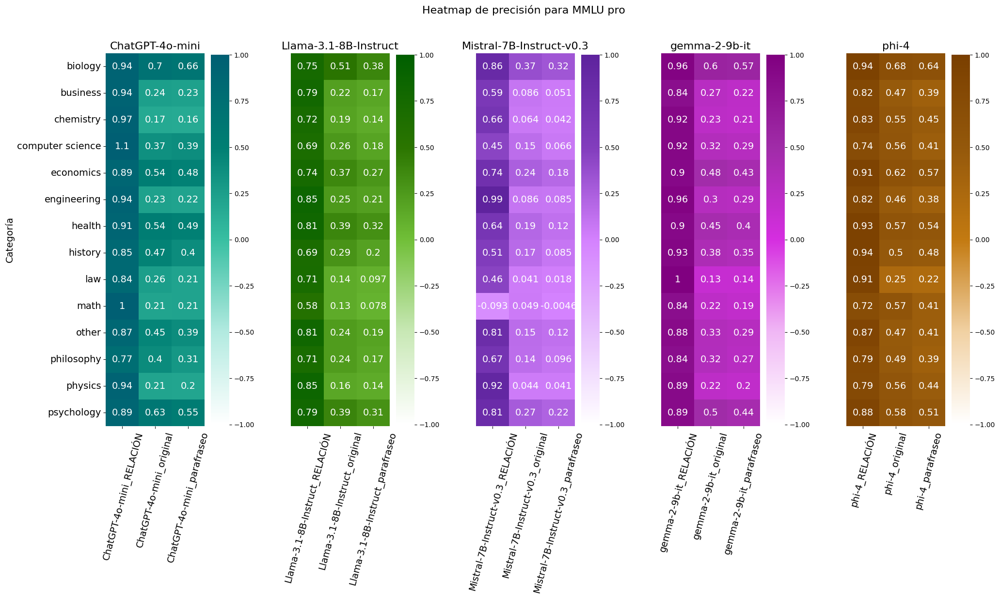

In [12]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
from matplotlib.colors import LinearSegmentedColormap

def plot_heatmaps(input_path):
    df_mmlu = pd.read_excel(input_path, sheet_name='MMLU', engine='openpyxl')
    df_mmlu_pro = pd.read_excel(input_path, sheet_name='MMLU_pro', engine='openpyxl')
    
    def create_combined_heatmap(df, title):
        df['CATEGORY'] = df['CATEGORY'].str.replace('_test', '', regex=False)
        categories = df['CATEGORY']
        models = sorted(set([col.split('_')[0] for col in df.columns if '_en_l0' in col]))
        
        cmap_list = [
            LinearSegmentedColormap.from_list(
                "turquesa", [
                    "#ffffff",  # Blanco
                    "#b2eae0",  # Turquesa muy claro
                    "#38BFA2",  # Turquesa medio
                    "#007f73",  # Turquesa oscuro
                    "#005f73"   # Azul oscuro
                ]
            ),
            LinearSegmentedColormap.from_list(
                "verde_pastel", [
                    "#ffffff",  # Blanco
                    "#c8e8b5",  # Verde muy claro
                    "#71BF38",  # Verde pastel medio
                    "#2b7500",  # Verde más oscuro
                    "#005f00"   # Verde oscuro profundo
                ]
            ),
            LinearSegmentedColormap.from_list(
                "morado_pastel", [
                    "#ffffff",  # Blanco
                    "#e7c1fd",  # Lavanda claro
                    "#D481FE",  # Morado pastel
                    "#823dbd",  # Morado medio
                    "#5e239d"   # Morado oscuro
                ]
            ),
            LinearSegmentedColormap.from_list(
                "magenta", [
                    "#ffffff",  # Blanco
                    "#f0b7f5",  # Rosa claro
                    "#D52EE0",  # Magenta
                    "#a02ca8",  # Púrpura medio
                    "#800080"   # Púrpura oscuro
                ]
            ),
            LinearSegmentedColormap.from_list(
                "naranja", [
                    "#ffffff",  # Blanco
                    "#f1d1a3",  # Naranja claro
                    "#C37A11",  # Naranja fuerte
                    "#94580b",  # Marrón medio
                    "#7a3f00"   # Marrón oscuro
                ]
            ),
            LinearSegmentedColormap.from_list(
                "rojizo", [
                    "#ffffff", "#f4c4c4", "#FF6B6B", "#C70039", "#7b1e1e"])  # NUEVO

        ]
        
        heatmap_data = []
        for model in models:
            en_l0_col, en_l1_col = f'{model}_NORMALIZED_enl0', f'{model}_NORMALIZED_enl1'
            # df[f'{model}_diff'] = df[en_l0_col] - df[en_l1_col]
            
            # Calcular el Z-score de la precisión para cada modelo (comentado)
            # df[f'{model}_zscore'] = (df[en_l1_col] - df[en_l0_col].mean()) / df[en_l0_col].std()
            df[f'{model}_normalized_loss'] = (df[en_l1_col] / df[en_l0_col]) 

            for category in categories:
                en_l0 = df.loc[df['CATEGORY'] == category, en_l0_col].values[0]
                en_l1 = df.loc[df['CATEGORY'] == category, en_l1_col].values[0]
                # diff = df.loc[df['CATEGORY'] == category, f'{model}_diff'].values[0]
                # zscore = df.loc[df['CATEGORY'] == category, f'{model}_zscore'].values[0]  # Comentado
                normalized_loss = df.loc[df['CATEGORY'] == category, f'{model}_normalized_loss'].values[0]

                heatmap_data.extend([
                    [category, f'{model}_original', en_l0],
                    [category, f'{model}_parafraseo', en_l1],
                    # [category, f'{model}_DIFFERENCE', diff],
                    # [category, f'{model}_Z-SCORE', zscore],  # Comentado
                    [category, f'{model}_RELACIÓN', normalized_loss]
                ])
        
        heatmap_df = pd.DataFrame(heatmap_data, columns=['CATEGORY', 'METRIC', 'VALUE'])
        heatmap_pivot = heatmap_df.pivot(index='CATEGORY', columns='METRIC', values='VALUE')
        
        fig_width = 8 + len(models) * 3  # Ajuste dinámico del ancho
        fig_height = max(10, len(categories) * 0.5)  # Ajuste dinámico de la altura
        fig, axes = plt.subplots(1, len(models), figsize=(fig_width, fig_height), sharey=True, gridspec_kw={'wspace': 0.5})
        
        if len(models) == 1:
            axes = [axes]
        
        for idx, (model, cmap) in enumerate(zip(models, cmap_list)):
            model_cols = [col for col in heatmap_pivot.columns if model in col]
            sns.heatmap(heatmap_pivot[model_cols], annot=True, annot_kws={"size": 14}, cmap=cmap, cbar=True, ax=axes[idx], vmin=-1, vmax=1)
            axes[idx].set_title(model, fontsize=16)
            axes[idx].set_xlabel('')
            axes[idx].set_ylabel('Categoría' if idx == 0 else '', fontsize=14)
            axes[idx].tick_params(axis='x',labelsize=14, rotation=75)
            axes[idx].tick_params(axis='y', labelsize=14)

            # Eliminar todos los bordes del gráfico
            for spine in axes[idx].spines.values():
                spine.set_visible(False)

            # Desactivar los ticks del eje Y para todos excepto el primero
            if idx != 0:
                axes[idx].tick_params(axis='y', left=False, labelleft=False)

            # Quitar las líneas del eje Y que generan rayitas
            axes[idx].grid(False)


        
        fig.suptitle(title, fontsize=16)
        plt.tight_layout(rect=[0, 0, 1, 0.95])
        plt.show()
    
    create_combined_heatmap(df_mmlu, 'Heatmap de precisión para MMLU')
    create_combined_heatmap(df_mmlu_pro, 'Heatmap de precisión para MMLU pro')

# Ejemplo de uso
input_path = 'CATEGORIES_ACCURACY_UPDATED.xlsx'
plot_heatmaps(input_path)

/var/folders/c2/7s13mf2d2v363_1g197xk9bm0000gn/T/ipykernel_1436/1193657733.py:88: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 1, 0.95])


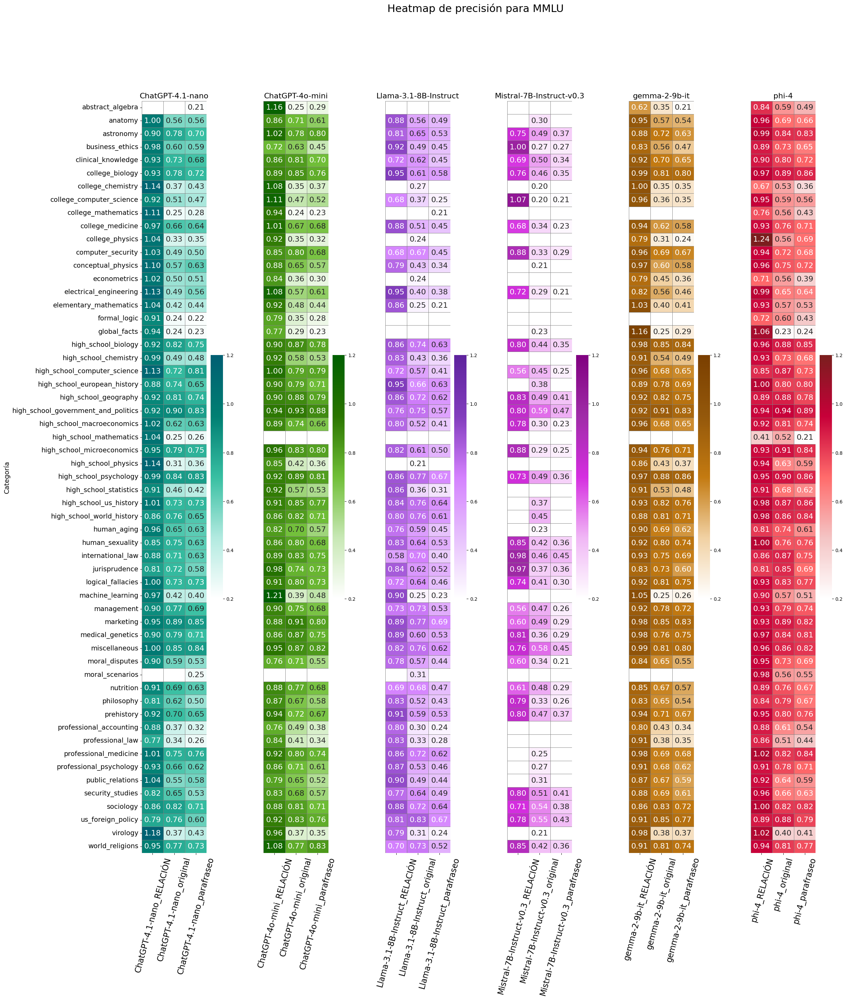

/var/folders/c2/7s13mf2d2v363_1g197xk9bm0000gn/T/ipykernel_1436/1193657733.py:88: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 1, 0.95])


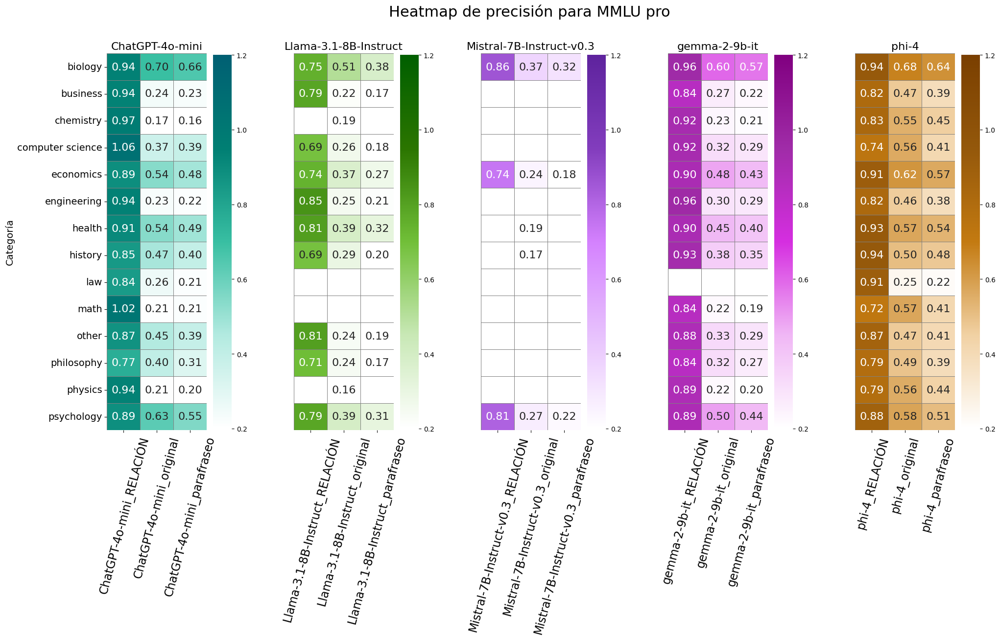

In [7]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
from matplotlib.colors import LinearSegmentedColormap

def plot_heatmaps(input_path, threshold_mmlu=0.2, threshold_mmlu_pro=0.15):
    df_mmlu = pd.read_excel(input_path, sheet_name='MMLU', engine='openpyxl')
    df_mmlu_pro = pd.read_excel(input_path, sheet_name='MMLU_pro', engine='openpyxl')

    def create_combined_heatmap(df, title, threshold):
        df['CATEGORY'] = df['CATEGORY'].str.replace('_test', '', regex=False)
        categories = df['CATEGORY']
        models = sorted(set([col.split('_')[0] for col in df.columns if '_enl0' in col]))

        cmap_list = [
            LinearSegmentedColormap.from_list("turquesa", ["#ffffff", "#b2eae0", "#38BFA2", "#007f73", "#005f73"]),
            LinearSegmentedColormap.from_list("verde_pastel", ["#ffffff", "#c8e8b5", "#71BF38", "#2b7500", "#005f00"]),
            LinearSegmentedColormap.from_list("morado_pastel", ["#ffffff", "#e7c1fd", "#D481FE", "#823dbd", "#5e239d"]),
            LinearSegmentedColormap.from_list("magenta", ["#ffffff", "#f0b7f5", "#D52EE0", "#a02ca8", "#800080"]),
            LinearSegmentedColormap.from_list("naranja", ["#ffffff", "#f1d1a3", "#C37A11", "#94580b", "#7a3f00"]),
            LinearSegmentedColormap.from_list("rojizo", ["#ffffff", "#f4c4c4", "#FF6B6B", "#C70039", "#7b1e1e"]),
        ]

        heatmap_data = []
        for model in models:
            en_l0_col, en_l1_col = f'{model}_NORMALIZED_enl0', f'{model}_NORMALIZED_enl1'

            # Reemplazar valores bajos con np.nan usando el umbral proporcionado
            df.loc[df[en_l0_col] < threshold, en_l0_col] = np.nan
            df.loc[df[en_l1_col] < threshold, en_l1_col] = np.nan

            df[f'{model}_normalized_loss'] = df[en_l1_col] / df[en_l0_col]

            for category in categories:
                en_l0 = df.loc[df['CATEGORY'] == category, en_l0_col].values[0]
                en_l1 = df.loc[df['CATEGORY'] == category, en_l1_col].values[0]
                normalized_loss = df.loc[df['CATEGORY'] == category, f'{model}_normalized_loss'].values[0]

                heatmap_data.extend([
                    [category, f'{model}_original', en_l0],
                    [category, f'{model}_parafraseo', en_l1],
                    [category, f'{model}_RELACIÓN', normalized_loss]
                ])

        heatmap_df = pd.DataFrame(heatmap_data, columns=['CATEGORY', 'METRIC', 'VALUE'])
        heatmap_pivot = heatmap_df.pivot(index='CATEGORY', columns='METRIC', values='VALUE')

        fig_width = 8 + len(models) * 3
        fig_height = max(10, len(categories) * 0.5)
        fig, axes = plt.subplots(1, len(models), figsize=(fig_width, fig_height), sharey=True, gridspec_kw={'wspace': 0.5})

        if len(models) == 1:
            axes = [axes]

        for idx, (model, cmap) in enumerate(zip(models, cmap_list)):
            model_cols = [col for col in heatmap_pivot.columns if model in col]
            sns.heatmap(
                heatmap_pivot[model_cols],
                annot=True,
                annot_kws={"size": 16},
                cmap=cmap,
                cbar=True,
                ax=axes[idx],
                vmin=0.2,
                vmax=1.2,
                linewidths=0.5,
                linecolor='gray',
                fmt=".2f",
                mask=heatmap_pivot[model_cols].isna()
            )

            axes[idx].set_title(model, fontsize=16)
            axes[idx].set_xlabel('')
            axes[idx].set_ylabel('Categoría' if idx == 0 else '', fontsize=14)
            axes[idx].tick_params(axis='x', labelsize=17, rotation=75)
            axes[idx].tick_params(axis='y', labelsize=14)

            for spine in axes[idx].spines.values():
                spine.set_visible(False)

            if idx != 0:
                axes[idx].tick_params(axis='y', left=False, labelleft=False)

            axes[idx].grid(False)

        fig.suptitle(title, fontsize=22)
        plt.tight_layout(rect=[0, 0, 1, 0.95])
        plt.show()

    # Llamadas con diferentes umbrales
    create_combined_heatmap(df_mmlu, 'Heatmap de precisión para MMLU', threshold_mmlu)
    create_combined_heatmap(df_mmlu_pro, 'Heatmap de precisión para MMLU pro', threshold_mmlu_pro)

# Ejemplo de uso
input_path = 'CATEGORIES_ACCURACY_UPDATED.xlsx'
plot_heatmaps(input_path, threshold_mmlu=0.2, threshold_mmlu_pro=0.15)



KeyError: 'ChatGPT-4.1-nano_NORMALIZED_enl0'

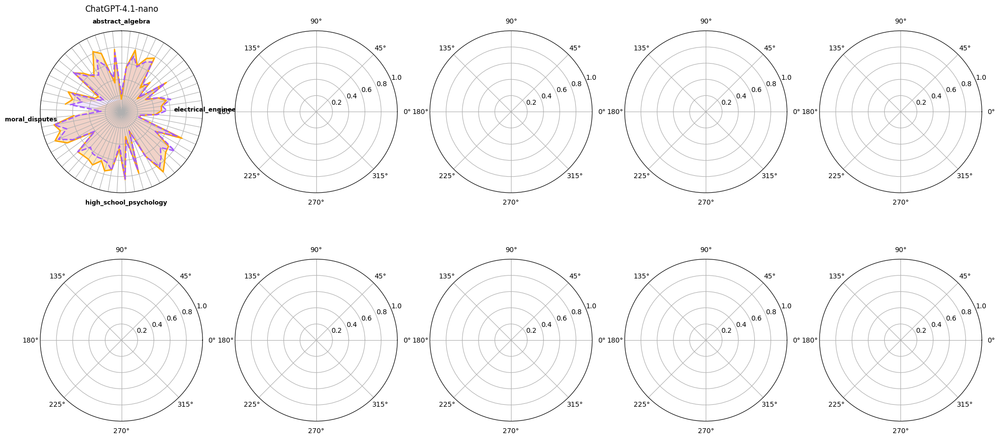

In [14]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

def plot_radar_chart_2x5_clean(input_path):
    df_mmlu = pd.read_excel(input_path, sheet_name='MMLU', engine='openpyxl')
    df_mmlu_pro = pd.read_excel(input_path, sheet_name='MMLU_pro', engine='openpyxl')

    def prepare_plot_data(df):
        df['CATEGORY'] = df['CATEGORY'].str.replace('_test', '', regex=False)
        categories = df['CATEGORY'].tolist()
        angles = np.linspace(0, 2 * np.pi, len(categories), endpoint=False).tolist()
        angles += angles[:1]
        models = sorted(set([col.split('_')[0] for col in df.columns if '_NORMALIZED_enl0' in col]))
        return df, categories, angles, models

    def plot_model(ax, df, model, angles, categories, label_mode='partial'):
        values_orig = df[f'{model}_NORMALIZED_enl0'].tolist() + [df[f'{model}_NORMALIZED_enl0'].tolist()[0]]
        values_para = df[f'{model}_NORMALIZED_enl1'].tolist() + [df[f'{model}_NORMALIZED_enl1'].tolist()[0]]

        ax.plot(angles, values_orig, label='Original', color='#FFA500', linewidth=2)
        ax.fill(angles, values_orig, color='#FFA500', alpha=0.25)

        ax.plot(angles, values_para, label='Parafraseado', color='#A259FF', linestyle='dashed', linewidth=2)
        ax.fill(angles, values_para, color='#A259FF', alpha=0.15)

        ax.set_theta_offset(np.pi / 2)
        ax.set_theta_direction(-1)
        ax.set_ylim(0, 1)
        ax.set_yticklabels([])
        ax.set_xticks(angles[:-1])

        if label_mode == 'all':
            ax.set_xticklabels(categories, fontsize=8)
        elif label_mode == 'partial':
            total = len(categories)
            xtick_labels = [''] * total
            cardinal_idx = [0, total // 4, total // 2, (3 * total) // 4]
            for i in cardinal_idx:
                xtick_labels[i] = categories[i]
            ax.set_xticklabels(xtick_labels, fontsize=9, fontweight='bold')
        else:
            ax.set_xticklabels([''] * len(categories))

    # Preparar figura
    df_mmlu, categories_mmlu, angles_mmlu, models = prepare_plot_data(df_mmlu)
    df_mmlu_pro, categories_pro, angles_pro, _ = prepare_plot_data(df_mmlu_pro)

    fig, axes = plt.subplots(2, 5, figsize=(24, 10), subplot_kw={'projection': 'polar'})
    
    # Deja espacio lateral para leyenda
    plt.subplots_adjust(left=0.05, right=0.85, top=0.9, bottom=0.1, hspace=0.4)

    for i in range(5):
        if i < len(models):
            # Fila MMLU
            ax_mmlu = axes[0][i]
            plot_model(ax_mmlu, df_mmlu, models[i], angles_mmlu, categories_mmlu, label_mode='partial')
            ax_mmlu.set_title(models[i], fontsize=12, pad=10)

            # Fila MMLU Pro
            ax_pro = axes[1][i]
            plot_model(ax_pro, df_mmlu_pro, models[i], angles_pro, categories_pro, label_mode='all')
            ax_pro.set_title(models[i], fontsize=12, pad=10)
        else:
            axes[0][i].axis('off')
            axes[1][i].axis('off')

    # Títulos de grupo (usando fig.text para que no los corte)
    fig.text(0.5, 0.95, 'MMLU', ha='center', va='center', fontsize=18, fontweight='bold')
    fig.text(0.5, 0.48, 'MMLU Pro', ha='center', va='center', fontsize=18, fontweight='bold')

    # Leyenda lateral
    fig.legend(
        handles=[
            plt.Line2D([0], [0], color='#FFA500', lw=2, label='Original'),
            plt.Line2D([0], [0], color='#A259FF', lw=2, linestyle='dashed', label='Parafraseado')
        ],
        loc='center left',
        bbox_to_anchor=(0.87, 0.5),
        fontsize=12
    )

    plt.show()

# Ejecutar
input_path = 'CATEGORIES_ACCURACY_UPDATED.xlsx'
plot_radar_chart_2x5_clean(input_path)




In [15]:
import pandas as pd

# Leer el archivo CATEGORIES_ACCURACY_UPDATED.xlsx
input_path = 'CATEGORIES_ACCURACY_UPDATED.xlsx'
df_mmlu = pd.read_excel(input_path, sheet_name='MMLU', engine='openpyxl')
df_mmlu_pro = pd.read_excel(input_path, sheet_name='MMLU_pro', engine='openpyxl')

def get_top_bottom_categories(df, metric, top_n=10):
    top_categories = df.nlargest(top_n, metric)['CATEGORY'].tolist()
    bottom_categories = df.nsmallest(top_n, metric)['CATEGORY'].tolist()
    return top_categories, bottom_categories

def process_models(df, models):
    results = {}
    for model in models:
        en_l0_col = f'{model}_NORMALIZED_enl0'
        en_l1_col = f'{model}_NORMALIZED_enl1'
        
        top_en_l0, bottom_en_l0 = get_top_bottom_categories(df, en_l0_col)
        top_en_l1, bottom_en_l1 = get_top_bottom_categories(df, en_l1_col)
        
        results[model] = {
            'Top_en_l0': top_en_l0,
            'Bottom_en_l0': bottom_en_l0,
            'Top_en_l1': top_en_l1,
            'Bottom_en_l1': bottom_en_l1
        }
    return results

def find_common_categories(results, models, key):
    common_categories = set(results[models[0]][key])
    for model in models[1:]:
        common_categories &= set(results[model][key])
    return list(common_categories)

# Procesar los modelos para MMLU y MMLU_pro
models_mmlu = [col.split('_')[0] for col in df_mmlu.columns if '_en_l0' in col]
models_mmlu_pro = [col.split('_')[0] for col in df_mmlu_pro.columns if '_en_l0' in col]

results_mmlu = process_models(df_mmlu, models_mmlu)
results_mmlu_pro = process_models(df_mmlu_pro, models_mmlu_pro)

# Encontrar categorías comunes
common_top_en_l0_mmlu = find_common_categories(results_mmlu, models_mmlu, 'Top_en_l0')
common_bottom_en_l0_mmlu = find_common_categories(results_mmlu, models_mmlu, 'Bottom_en_l0')
common_top_en_l1_mmlu = find_common_categories(results_mmlu, models_mmlu, 'Top_en_l1')
common_bottom_en_l1_mmlu = find_common_categories(results_mmlu, models_mmlu, 'Bottom_en_l1')

common_top_en_l0_mmlu_pro = find_common_categories(results_mmlu_pro, models_mmlu_pro, 'Top_en_l0')
common_bottom_en_l0_mmlu_pro = find_common_categories(results_mmlu_pro, models_mmlu_pro, 'Bottom_en_l0')
common_top_en_l1_mmlu_pro = find_common_categories(results_mmlu_pro, models_mmlu_pro, 'Top_en_l1')
common_bottom_en_l1_mmlu_pro = find_common_categories(results_mmlu_pro, models_mmlu_pro, 'Bottom_en_l1')

# Guardar los resultados en un archivo Excel
output_path = 'TOP_BOTTOM_CATEGORIES.xlsx'
with pd.ExcelWriter(output_path, engine='openpyxl') as writer:
    for model, data in results_mmlu.items():
        max_len = max(len(data['Top_en_l0']), len(data['Bottom_en_l0']), len(data['Top_en_l1']), len(data['Bottom_en_l1']))
        df = pd.DataFrame({
            'Top_en_l0': data['Top_en_l0'] + [''] * (max_len - len(data['Top_en_l0'])),
            'Bottom_en_l0': data['Bottom_en_l0'] + [''] * (max_len - len(data['Bottom_en_l0'])),
            'Top_en_l1': data['Top_en_l1'] + [''] * (max_len - len(data['Top_en_l1'])),
            'Bottom_en_l1': data['Bottom_en_l1'] + [''] * (max_len - len(data['Bottom_en_l1']))
        })
        df.to_excel(writer, sheet_name=f'MMLU_{model}', index=False)
    
    for model, data in results_mmlu_pro.items():
        max_len = max(len(data['Top_en_l0']), len(data['Bottom_en_l0']), len(data['Top_en_l1']), len(data['Bottom_en_l1']))
        df = pd.DataFrame({
            'Top_en_l0': data['Top_en_l0'] + [''] * (max_len - len(data['Top_en_l0'])),
            'Bottom_en_l0': data['Bottom_en_l0'] + [''] * (max_len - len(data['Bottom_en_l0'])),
            'Top_en_l1': data['Top_en_l1'] + [''] * (max_len - len(data['Top_en_l1'])),
            'Bottom_en_l1': data['Bottom_en_l1'] + [''] * (max_len - len(data['Bottom_en_l1']))
        })
        df.to_excel(writer, sheet_name=f'MMLU_pro_{model}', index=False)
    
    max_len_common = max(len(common_top_en_l0_mmlu), len(common_bottom_en_l0_mmlu), len(common_top_en_l1_mmlu), len(common_bottom_en_l1_mmlu),
                         len(common_top_en_l0_mmlu_pro), len(common_bottom_en_l0_mmlu_pro), len(common_top_en_l1_mmlu_pro), len(common_bottom_en_l1_mmlu_pro))
    common_df = pd.DataFrame({
        'Common_Top_en_l0_MMLU': common_top_en_l0_mmlu + [''] * (max_len_common - len(common_top_en_l0_mmlu)),
        'Common_Bottom_en_l0_MMLU': common_bottom_en_l0_mmlu + [''] * (max_len_common - len(common_bottom_en_l0_mmlu)),
        'Common_Top_en_l1_MMLU': common_top_en_l1_mmlu + [''] * (max_len_common - len(common_top_en_l1_mmlu)),
        'Common_Bottom_en_l1_MMLU': common_bottom_en_l1_mmlu + [''] * (max_len_common - len(common_bottom_en_l1_mmlu)),
        'Common_Top_en_l0_MMLU_pro': common_top_en_l0_mmlu_pro + [''] * (max_len_common - len(common_top_en_l0_mmlu_pro)),
        'Common_Bottom_en_l0_MMLU_pro': common_bottom_en_l0_mmlu_pro + [''] * (max_len_common - len(common_bottom_en_l0_mmlu_pro)),
        'Common_Top_en_l1_MMLU_pro': common_top_en_l1_mmlu_pro + [''] * (max_len_common - len(common_top_en_l1_mmlu_pro)),
        'Common_Bottom_en_l1_MMLU_pro': common_bottom_en_l1_mmlu_pro + [''] * (max_len_common - len(common_bottom_en_l1_mmlu_pro))
    })
    common_df.to_excel(writer, sheet_name='Common_Categories', index=False)

print("Archivo TOP_BOTTOM_CATEGORIES.xlsx generado con éxito.")

Archivo TOP_BOTTOM_CATEGORIES.xlsx generado con éxito.


/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/openpyxl/workbook/child.py:99: UserWarning: Title is more than 31 characters. Some applications may not be able to read the file
  warnings.warn("Title is more than 31 characters. Some applications may not be able to read the file")


In [16]:
import pandas as pd

# Leer el archivo CATEGORIES_ACCURACY.xlsx
input_path = 'CATEGORIES_ACCURACY.xlsx'
df_mmlu = pd.read_excel(input_path, sheet_name='MMLU', engine='openpyxl')
df_mmlu_pro = pd.read_excel(input_path, sheet_name='MMLU_pro', engine='openpyxl')

def rank_categories(df, models):
    rankings = {}
    for model in models:
        en_l0_col = f'{model}_en_l0'
        en_l1_col = f'{model}_en_l1'
        
        df[f'{model}_rank_en_l0'] = df[en_l0_col].rank(method='min', ascending=True) - 1
        df[f'{model}_rank_en_l1'] = df[en_l1_col].rank(method='min', ascending=True) - 1
        
        rankings[model] = {
            'Original': df[['CATEGORY', f'{model}_rank_en_l0']].rename(columns={f'{model}_rank_en_l0': 'Rank'}),
            'Paraphrase': df[['CATEGORY', f'{model}_rank_en_l1']].rename(columns={f'{model}_rank_en_l1': 'Rank'})
        }
    return rankings

def aggregate_rankings(rankings, models):
    aggregated = {
        'Original': pd.DataFrame(),
        'Paraphrase': pd.DataFrame()
    }
    
    for model in models:
        aggregated['Original'] = pd.concat([aggregated['Original'], rankings[model]['Original']], axis=0)
        aggregated['Paraphrase'] = pd.concat([aggregated['Paraphrase'], rankings[model]['Paraphrase']], axis=0)
    
    aggregated['Original'] = aggregated['Original'].groupby('CATEGORY')['Rank'].sum().reset_index().sort_values(by='Rank', ascending=False)
    aggregated['Paraphrase'] = aggregated['Paraphrase'].groupby('CATEGORY')['Rank'].sum().reset_index().sort_values(by='Rank', ascending=False)
    
    return aggregated

# Procesar los modelos para MMLU y MMLU_pro
models_mmlu = [col.split('_')[0] for col in df_mmlu.columns if '_en_l0' in col]
models_mmlu_pro = [col.split('_')[0] for col in df_mmlu_pro.columns if '_en_l0' in col]

rankings_mmlu = rank_categories(df_mmlu, models_mmlu)
rankings_mmlu_pro = rank_categories(df_mmlu_pro, models_mmlu_pro)

aggregated_mmlu = aggregate_rankings(rankings_mmlu, models_mmlu)
aggregated_mmlu_pro = aggregate_rankings(rankings_mmlu_pro, models_mmlu_pro)

# Guardar los resultados en un archivo Excel
output_path = 'CATEGORY_RANKINGS.xlsx'
with pd.ExcelWriter(output_path, engine='openpyxl') as writer:
    for model, data in rankings_mmlu.items():
        data['Original'].to_excel(writer, sheet_name=f'MMLU_{model}_Original', index=False)
        data['Paraphrase'].to_excel(writer, sheet_name=f'MMLU_{model}_Paraphrase', index=False)
    
    for model, data in rankings_mmlu_pro.items():
        data['Original'].to_excel(writer, sheet_name=f'MMLU_pro_{model}_Original', index=False)
        data['Paraphrase'].to_excel(writer, sheet_name=f'MMLU_pro_{model}_Paraphrase', index=False)
    
    aggregated_mmlu['Original'].to_excel(writer, sheet_name='MMLU_Original', index=False)
    aggregated_mmlu['Paraphrase'].to_excel(writer, sheet_name='MMLU_Paraphrase', index=False)
    aggregated_mmlu_pro['Original'].to_excel(writer, sheet_name='MMLU_pro_Original', index=False)
    aggregated_mmlu_pro['Paraphrase'].to_excel(writer, sheet_name='MMLU_pro_Paraphrase', index=False)

print("Archivo CATEGORY_RANKINGS.xlsx generado con éxito.")

Archivo CATEGORY_RANKINGS.xlsx generado con éxito.


/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/openpyxl/workbook/child.py:99: UserWarning: Title is more than 31 characters. Some applications may not be able to read the file
  warnings.warn("Title is more than 31 characters. Some applications may not be able to read the file")


/var/folders/c2/7s13mf2d2v363_1g197xk9bm0000gn/T/ipykernel_1853/2525109519.py:54: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(ax=axes[0], x='Rank', y='CATEGORY', data=aggregated['Original'], palette='viridis')
/var/folders/c2/7s13mf2d2v363_1g197xk9bm0000gn/T/ipykernel_1853/2525109519.py:59: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(ax=axes[1], x='Rank', y='CATEGORY', data=aggregated['Paraphrase'], palette='magma')


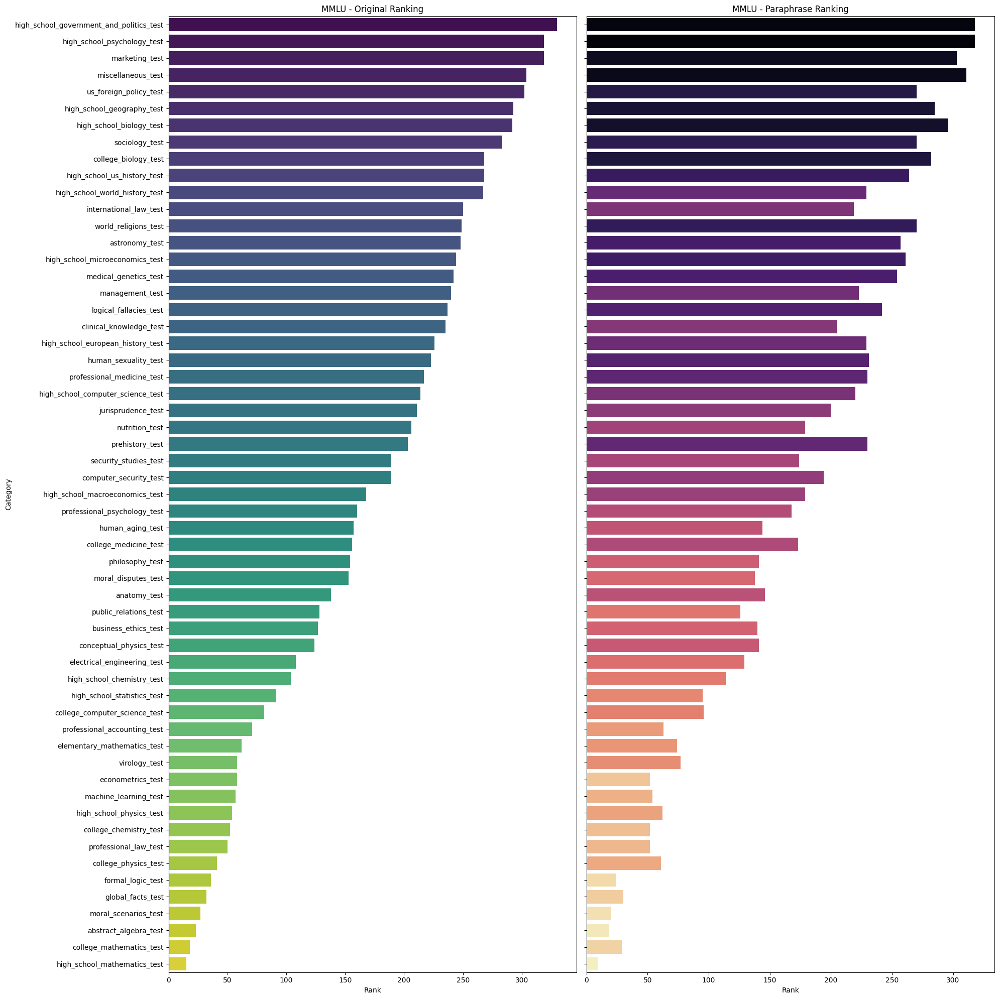

/var/folders/c2/7s13mf2d2v363_1g197xk9bm0000gn/T/ipykernel_1853/2525109519.py:54: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(ax=axes[0], x='Rank', y='CATEGORY', data=aggregated['Original'], palette='viridis')
/var/folders/c2/7s13mf2d2v363_1g197xk9bm0000gn/T/ipykernel_1853/2525109519.py:59: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(ax=axes[1], x='Rank', y='CATEGORY', data=aggregated['Paraphrase'], palette='magma')


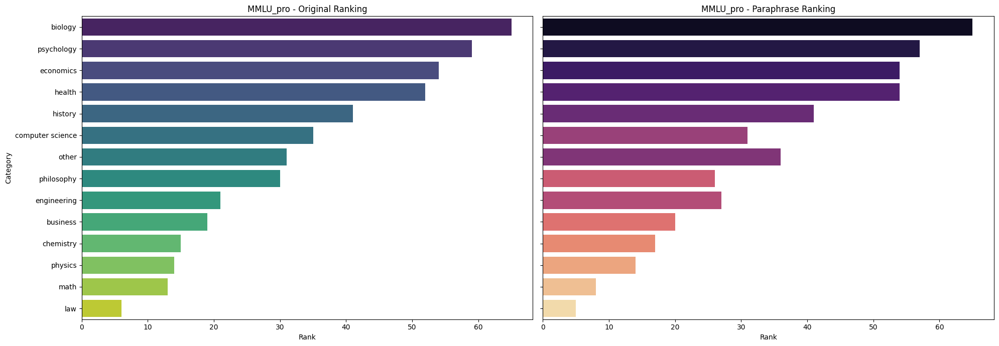

In [17]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Leer el archivo CATEGORIES_ACCURACY.xlsx
input_path = 'CATEGORIES_ACCURACY.xlsx'
df_mmlu = pd.read_excel(input_path, sheet_name='MMLU', engine='openpyxl')
df_mmlu_pro = pd.read_excel(input_path, sheet_name='MMLU_pro', engine='openpyxl')

def rank_categories(df, models):
    rankings = {}
    for model in models:
        en_l0_col = f'{model}_en_l0'
        en_l1_col = f'{model}_en_l1'
        
        df[f'{model}_rank_en_l0'] = df[en_l0_col].rank(method='min', ascending=True) - 1
        df[f'{model}_rank_en_l1'] = df[en_l1_col].rank(method='min', ascending=True) - 1
        
        rankings[model] = {
            'Original': df[['CATEGORY', f'{model}_rank_en_l0']].rename(columns={f'{model}_rank_en_l0': 'Rank'}),
            'Paraphrase': df[['CATEGORY', f'{model}_rank_en_l1']].rename(columns={f'{model}_rank_en_l1': 'Rank'})
        }
    return rankings

def aggregate_rankings(rankings, models):
    aggregated = {
        'Original': pd.DataFrame(),
        'Paraphrase': pd.DataFrame()
    }
    
    for model in models:
        aggregated['Original'] = pd.concat([aggregated['Original'], rankings[model]['Original']], axis=0)
        aggregated['Paraphrase'] = pd.concat([aggregated['Paraphrase'], rankings[model]['Paraphrase']], axis=0)
    
    aggregated['Original'] = aggregated['Original'].groupby('CATEGORY')['Rank'].sum().reset_index().sort_values(by='Rank', ascending=False)
    aggregated['Paraphrase'] = aggregated['Paraphrase'].groupby('CATEGORY')['Rank'].sum().reset_index().sort_values(by='Rank', ascending=False)
    
    return aggregated

# Procesar los modelos para MMLU y MMLU_pro
models_mmlu = [col.split('_')[0] for col in df_mmlu.columns if '_en_l0' in col]
models_mmlu_pro = [col.split('_')[0] for col in df_mmlu_pro.columns if '_en_l0' in col]

rankings_mmlu = rank_categories(df_mmlu, models_mmlu)
rankings_mmlu_pro = rank_categories(df_mmlu_pro, models_mmlu_pro)

aggregated_mmlu = aggregate_rankings(rankings_mmlu, models_mmlu)
aggregated_mmlu_pro = aggregate_rankings(rankings_mmlu_pro, models_mmlu_pro)

# Función para crear gráficos de barras en una sola imagen
def plot_combined_rankings(aggregated, title1, title2, figsize):
    fig, axes = plt.subplots(1, 2, figsize=figsize, sharey=True)
    
    sns.barplot(ax=axes[0], x='Rank', y='CATEGORY', data=aggregated['Original'], palette='viridis')
    axes[0].set_title(title1)
    axes[0].set_xlabel('Rank')
    axes[0].set_ylabel('Category')
    
    sns.barplot(ax=axes[1], x='Rank', y='CATEGORY', data=aggregated['Paraphrase'], palette='magma')
    axes[1].set_title(title2)
    axes[1].set_xlabel('Rank')
    axes[1].set_ylabel('')
    
    plt.tight_layout()
    plt.show()

# Crear gráficos combinados
plot_combined_rankings(aggregated_mmlu, 'MMLU - Original Ranking', 'MMLU - Paraphrase Ranking', (20, 20))
plot_combined_rankings(aggregated_mmlu_pro, 'MMLU_pro - Original Ranking', 'MMLU_pro - Paraphrase Ranking', (20, len(aggregated_mmlu_pro['Original']) * 0.5))


/var/folders/c2/7s13mf2d2v363_1g197xk9bm0000gn/T/ipykernel_1853/2933822326.py:54: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(ax=axes[0], x='Rank', y='CATEGORY', data=aggregated['Original'], palette='viridis', order=aggregated['Original']['CATEGORY'])
/var/folders/c2/7s13mf2d2v363_1g197xk9bm0000gn/T/ipykernel_1853/2933822326.py:59: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(ax=axes[1], x='Rank', y='CATEGORY', data=aggregated['Paraphrase'], palette='magma', order=aggregated['Paraphrase']['CATEGORY'])


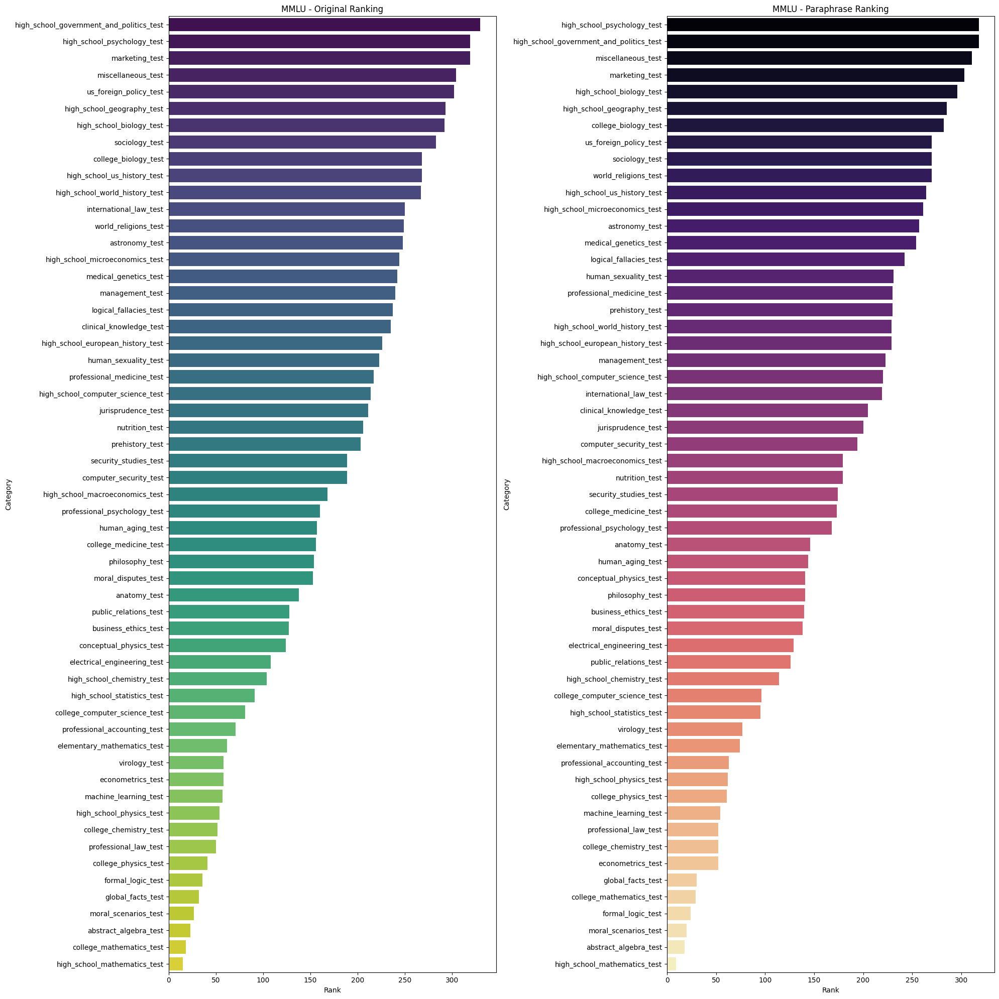

/var/folders/c2/7s13mf2d2v363_1g197xk9bm0000gn/T/ipykernel_1853/2933822326.py:54: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(ax=axes[0], x='Rank', y='CATEGORY', data=aggregated['Original'], palette='viridis', order=aggregated['Original']['CATEGORY'])
/var/folders/c2/7s13mf2d2v363_1g197xk9bm0000gn/T/ipykernel_1853/2933822326.py:59: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(ax=axes[1], x='Rank', y='CATEGORY', data=aggregated['Paraphrase'], palette='magma', order=aggregated['Paraphrase']['CATEGORY'])


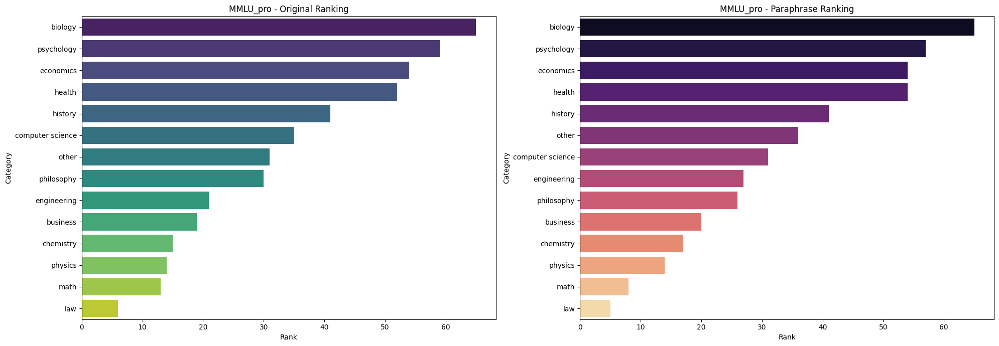

In [18]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Leer el archivo CATEGORIES_ACCURACY.xlsx
input_path = 'CATEGORIES_ACCURACY.xlsx'
df_mmlu = pd.read_excel(input_path, sheet_name='MMLU', engine='openpyxl')
df_mmlu_pro = pd.read_excel(input_path, sheet_name='MMLU_pro', engine='openpyxl')

def rank_categories(df, models):
    rankings = {}
    for model in models:
        en_l0_col = f'{model}_en_l0'
        en_l1_col = f'{model}_en_l1'
        
        df[f'{model}_rank_en_l0'] = df[en_l0_col].rank(method='min', ascending=True) - 1
        df[f'{model}_rank_en_l1'] = df[en_l1_col].rank(method='min', ascending=True) - 1
        
        rankings[model] = {
            'Original': df[['CATEGORY', f'{model}_rank_en_l0']].rename(columns={f'{model}_rank_en_l0': 'Rank'}),
            'Paraphrase': df[['CATEGORY', f'{model}_rank_en_l1']].rename(columns={f'{model}_rank_en_l1': 'Rank'})
        }
    return rankings

def aggregate_rankings(rankings, models):
    aggregated = {
        'Original': pd.DataFrame(),
        'Paraphrase': pd.DataFrame()
    }
    
    for model in models:
        aggregated['Original'] = pd.concat([aggregated['Original'], rankings[model]['Original']], axis=0)
        aggregated['Paraphrase'] = pd.concat([aggregated['Paraphrase'], rankings[model]['Paraphrase']], axis=0)
    
    aggregated['Original'] = aggregated['Original'].groupby('CATEGORY')['Rank'].sum().reset_index().sort_values(by='Rank', ascending=False)
    aggregated['Paraphrase'] = aggregated['Paraphrase'].groupby('CATEGORY')['Rank'].sum().reset_index().sort_values(by='Rank', ascending=False)
    
    return aggregated

# Procesar los modelos para MMLU y MMLU_pro
models_mmlu = [col.split('_')[0] for col in df_mmlu.columns if '_en_l0' in col]
models_mmlu_pro = [col.split('_')[0] for col in df_mmlu_pro.columns if '_en_l0' in col]

rankings_mmlu = rank_categories(df_mmlu, models_mmlu)
rankings_mmlu_pro = rank_categories(df_mmlu_pro, models_mmlu_pro)

aggregated_mmlu = aggregate_rankings(rankings_mmlu, models_mmlu)
aggregated_mmlu_pro = aggregate_rankings(rankings_mmlu_pro, models_mmlu_pro)

# Función para crear gráficos de barras en una sola imagen
def plot_combined_rankings(aggregated, title1, title2, figsize):
    fig, axes = plt.subplots(1, 2, figsize=figsize)
    
    sns.barplot(ax=axes[0], x='Rank', y='CATEGORY', data=aggregated['Original'], palette='viridis', order=aggregated['Original']['CATEGORY'])
    axes[0].set_title(title1)
    axes[0].set_xlabel('Rank')
    axes[0].set_ylabel('Category')
    
    sns.barplot(ax=axes[1], x='Rank', y='CATEGORY', data=aggregated['Paraphrase'], palette='magma', order=aggregated['Paraphrase']['CATEGORY'])
    axes[1].set_title(title2)
    axes[1].set_xlabel('Rank')
    axes[1].set_ylabel('Category')
    
    plt.tight_layout()
    plt.show()

# Crear gráficos combinados
plot_combined_rankings(aggregated_mmlu, 'MMLU - Original Ranking', 'MMLU - Paraphrase Ranking', (20, 20))
plot_combined_rankings(aggregated_mmlu_pro, 'MMLU_pro - Original Ranking', 'MMLU_pro - Paraphrase Ranking', (20, len(aggregated_mmlu_pro['Original']) * 0.5))

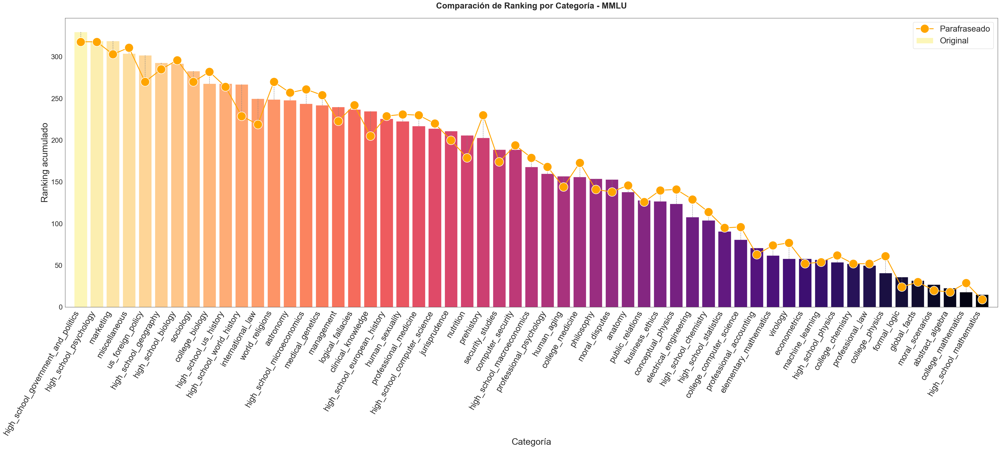

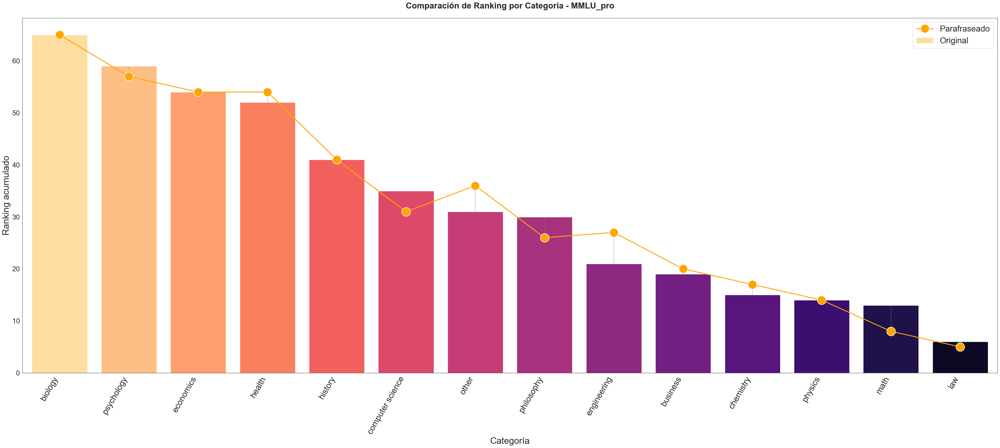

In [19]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Leer los datos
input_path = 'CATEGORIES_ACCURACY.xlsx'
df_mmlu = pd.read_excel(input_path, sheet_name='MMLU', engine='openpyxl')
df_mmlu_pro = pd.read_excel(input_path, sheet_name='MMLU_pro', engine='openpyxl')

# Quitar "_test" de nombres de categoría en MMLU
df_mmlu['CATEGORY'] = df_mmlu['CATEGORY'].str.replace('_test', '', regex=False)

def rank_categories(df, models):
    rankings = {}
    for model in models:
        en_l0_col = f'{model}_en_l0'
        en_l1_col = f'{model}_en_l1'

        df[f'{model}_rank_en_l0'] = df[en_l0_col].rank(method='min', ascending=True) - 1
        df[f'{model}_rank_en_l1'] = df[en_l1_col].rank(method='min', ascending=True) - 1

        rankings[model] = {
            'Original': df[['CATEGORY', f'{model}_rank_en_l0']].rename(columns={f'{model}_rank_en_l0': 'Rank'}),
            'Paraphrase': df[['CATEGORY', f'{model}_rank_en_l1']].rename(columns={f'{model}_rank_en_l1': 'Rank'})
        }
    return rankings

def aggregate_rankings(rankings, models):
    aggregated = {
        'Original': pd.DataFrame(),
        'Paraphrase': pd.DataFrame()
    }

    for model in models:
        aggregated['Original'] = pd.concat([aggregated['Original'], rankings[model]['Original']], axis=0)
        aggregated['Paraphrase'] = pd.concat([aggregated['Paraphrase'], rankings[model]['Paraphrase']], axis=0)

    aggregated['Original'] = aggregated['Original'].groupby('CATEGORY')['Rank'].sum().reset_index().sort_values(by='Rank', ascending=False)
    aggregated['Paraphrase'] = aggregated['Paraphrase'].groupby('CATEGORY')['Rank'].sum().reset_index().sort_values(by='Rank', ascending=False)

    return aggregated

def plot_ranking_comparison(aggregated, title, figsize=(40, 18)):
    df_merged = pd.merge(aggregated['Original'], aggregated['Paraphrase'], on='CATEGORY', suffixes=('_original', '_paraphrase'))
    df_merged = df_merged.sort_values(by='Rank_original', ascending=False).reset_index(drop=True)

    sns.set_style("white")
    fig, ax = plt.subplots(figsize=figsize)

    bar_colors = sns.color_palette("magma_r", len(df_merged))
    ax.bar(range(len(df_merged)), df_merged['Rank_original'], color=bar_colors, label='Original')

    # Línea conectando los puntos de paraphrased
    ax.plot(range(len(df_merged)), df_merged['Rank_paraphrase'],
            color='orange', linewidth=2.5, linestyle='-', marker='o',
            markersize=25, markeredgecolor='white', markeredgewidth=1.5,
            label='Parafraseado', zorder=5)

    # Líneas verticales entre cada barra y punto
    for i in range(len(df_merged)):
        ax.plot([i, i],
                [df_merged['Rank_original'][i], df_merged['Rank_paraphrase'][i]],
                color='gray', linestyle='--', linewidth=1, zorder=3)

    # Eje X: categorías centradas
    ax.set_xticks(range(len(df_merged)))
    ax.set_xticklabels(df_merged['CATEGORY'], rotation=60, ha='right', fontsize=24)

    ax.set_title(title, fontsize=24, fontweight='bold', pad=27)
    ax.set_ylabel('Ranking acumulado', fontsize=26)
    ax.set_xlabel('Categoría', fontsize=26)
    ax.tick_params(axis='y', labelsize=20)
    
    # Márgenes para evitar corte de etiquetas
    ax.margins(x=0.01)

    # Leyenda
    ax.legend(loc='upper right', fontsize=24)
    
    plt.tight_layout()
    plt.show()


# Procesar rankings
models_mmlu = [col.split('_')[0] for col in df_mmlu.columns if '_en_l0' in col]
models_mmlu_pro = [col.split('_')[0] for col in df_mmlu_pro.columns if '_en_l0' in col]

rankings_mmlu = rank_categories(df_mmlu, models_mmlu)
rankings_mmlu_pro = rank_categories(df_mmlu_pro, models_mmlu_pro)

aggregated_mmlu = aggregate_rankings(rankings_mmlu, models_mmlu)
aggregated_mmlu_pro = aggregate_rankings(rankings_mmlu_pro, models_mmlu_pro)

# Graficar resultados
plot_ranking_comparison(aggregated_mmlu, 'Comparación de Ranking por Categoría - MMLU')
plot_ranking_comparison(aggregated_mmlu_pro, 'Comparación de Ranking por Categoría - MMLU_pro')


